In [26]:
import os
import pandas as pd
import numpy as np
from PIL import Image, ImageOps
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import random
import cv2
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from collections import Counter
import json
import seaborn as sns

In [2]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [3]:
def show_anno_draw(coco):
    names = np.load('/gdrive/My Drive/real/a_10/names.npy',allow_pickle=True)
    dataDir = '/gdrive/My Drive/real'
    imgDir = '/gdrive/My Drive/real/a_10'
    catIDs = coco.getCatIds()
    cats = coco.loadCats(catIDs)
    plt.figure(figsize=(20,20))
    ids = coco.getImgIds(catIds=[4])
    for i, id in enumerate(ids):
        plt.subplot(3,4,i+1)
        plt.axis('off')
        index = eval(coco.loadImgs([id])[0]['file_name'][-5])
        img = names[index]
        I = Image.open('{}/{}'.format(imgDir, img))
        plt.imshow(I)
        annIds = coco.getAnnIds(imgIds=id, catIds=[4], iscrowd=None)
        anns = coco.loadAnns(annIds)
        coco.showAnns(anns)

def show_anno_draw_p(coco, coco_train):
    names = np.load('/gdrive/My Drive/real/a_10/names.npy',allow_pickle=True)
    imgs = np.load('/gdrive/My Drive/real/a_10/imgs.npy',allow_pickle=True)
    dataDir = '/gdrive/My Drive/real'
    imgDir = '/gdrive/My Drive/real/a_10'
    catIDs = coco.getCatIds()
    cats = coco.loadCats(catIDs)
    catIDs_train = coco_train.getCatIds()
    cats_train = coco_train.loadCats(catIDs_train)
    plt.figure(figsize=(20,20))
    ids = coco.getImgIds(catIds=[4])
    for i, id in enumerate(ids):
        plt.subplot(6,4,2*i+1)
        plt.axis('off')
        index = eval(coco.loadImgs([id])[0]['file_name'][-5])
        img = names[index]
        I = Image.open('{}/{}'.format(imgDir, img))
        plt.imshow(I)
        annIds = coco.getAnnIds(imgIds=id, catIds=[4], iscrowd=None)
        anns = coco.loadAnns(annIds)
        coco.showAnns(anns)
        plt.subplot(6,4,2*i+2)
        plt.axis('off')
        plt.imshow(I)
        annIds = coco_train.getAnnIds(imgIds=imgs[index]['id'], catIds=[1], iscrowd=None)
        anns = coco_train.loadAnns(annIds)
        coco_train.showAnns(anns)

In [4]:
def create_flatten_mask(coco, anns, height, width):
    mask = np.zeros((height, width))
    for i in range(len(anns)):
        mask = np.maximum(coco.annToMask(anns[i]), mask) #*255.0
    mask = Image.fromarray(mask)
    mask = np.array(mask)
    return mask.flatten()

def IoU(y_pre, y_true):
    y_pre = y_pre.astype(int)
    y_true = y_true.astype(int)
    I = np.bitwise_and(y_pre, y_true).sum().item()
    U = np.bitwise_or(y_pre, y_true).sum().item()
    if U == 0:
        return 1
    if I > U:
        print('iou counting error')
    return float(I)/U

def iou_cal(coco, coco_train):
    names = np.load('/gdrive/My Drive/real/a_10/names.npy',allow_pickle=True)
    imgs = np.load('/gdrive/My Drive/real/a_10/imgs.npy',allow_pickle=True)
    dataDir = '/gdrive/My Drive/real'
    imgDir = '/gdrive/My Drive/real/a_10'
    catIDs = coco.getCatIds()
    cats = coco.loadCats(catIDs)
    catIDs_train = coco_train.getCatIds()
    cats_train = coco_train.loadCats(catIDs_train)
    ids = coco.getImgIds(catIds=[4])
    iouList = []
    for i, id in enumerate(ids):
        index = eval(coco.loadImgs([id])[0]['file_name'][-5])
        # img = names[index]

        annIds = coco_train.getAnnIds(imgIds=imgs[index]['id'], catIds=[1], iscrowd=None)
        anns = coco_train.loadAnns(annIds)
        mask_p = create_flatten_mask(coco_train, anns, imgs[index]['height'], imgs[index]['width'])

        annIds = coco.getAnnIds(imgIds=id, catIds=[4], iscrowd=None)
        anns = coco.loadAnns(annIds)
        mask = create_flatten_mask(coco, anns, imgs[index]['height'], imgs[index]['width'])

        iou = IoU(mask, mask_p)
        iouList.append(iou)
    print(np.mean(iouList))
    return iouList



In [5]:
x=np.load('/gdrive/My Drive/anno/person_all.npy',allow_pickle=True)
print(len(x))

64115


In [ ]:
iouListAll = []
jsonList = np.load('/gdrive/My Drive/real/a_10/json.npy',allow_pickle=True)
print(jsonList)

['01_chris_perfect-1.json' '01_shen_approx_contour-12.json'
 '01_xian_triangle-21.json' '02_chris_individual_bounding_box-2.json'
 '02_shen_less_precise_contour-13.json' '02_xian_pentagon-22.json'
 '03_chris_multiple_bounding_box-3.json' '03_shen_triangle-14.json'
 '03_xian_8_to_12_edges-24.json' '04_chris_approx_contour-4.json'
 '04_shen_pentagon-15.json' '04_xian_one_point-25.json'
 '05_chris_less_precise_contour-5.json'
 '05_shen_8_to_12_edge_polygon-16.json' '05_xian_scribble-26.json'
 '06_chris_triangle-6.json' '06_shen_one_point-17.json'
 '06_xian_perfect-27.json' '07_chris_pentagon-7.json'
 '07_shen_scribble-18.json' '07_xian_individual_bounding_box-28.json'
 '08_chris_8_to_12_edge_polygon-8.json' '08_shen_perfect-19.json'
 '08_xian_multiple_bounding_box-29.json' '09_chris_one_point-9.json'
 '09_shen_individual_bounding_box-20.json'
 '09_xian_approx_contour-30.json' '10_chris_scribble-10.json'
 '10_shen_multiple_bounding_box-11.json'
 '10_xian_less_precise_contour-31.json']


In [6]:
coco_train = COCO('/gdrive/My Drive/anno/instances_train2017.json')
# coco = COCO('/gdrive/My Drive/real/03_maciej_perfect-34.json')

loading annotations into memory...
Done (t=29.98s)
creating index...
index created!


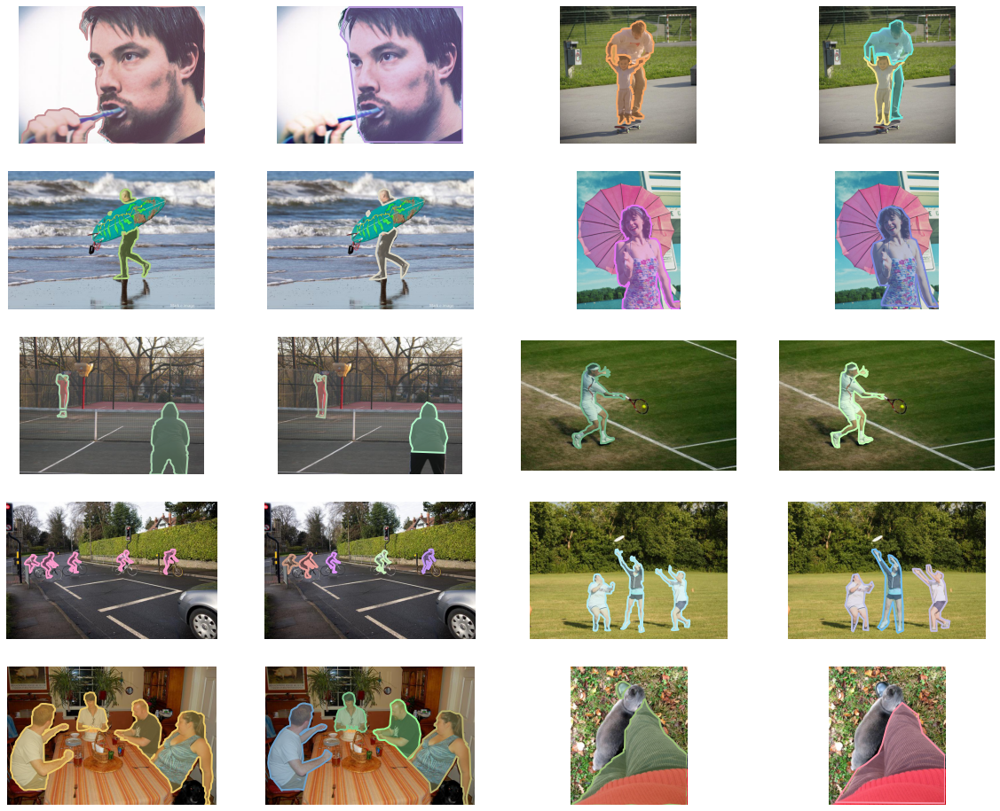

In [ ]:
show_anno_draw_p(coco, coco_train)


In [ ]:
print(iou_cal(coco, coco_train))

0.837557426951997
[0.8413305600051004, 0.8886733665271711, 0.8157112993728683, 0.8957918898240245, 0.6603176762695147, 0.8883727681811584, 0.7482833957553059, 0.7716157903148474, 0.9500238866181857, 0.9154536366517934]


loading annotations into memory...
Done (t=0.16s)
creating index...
index created!
0.6971841262006164


[0.6585594013096352,
 0.7376575701136394,
 0.7823521867384892,
 0.890948093965396,
 0.8120870095915492,
 0.7586901229334464,
 0.49217710774688034,
 0.8205410581757242,
 0.4977559144965388,
 0.5210727969348659]

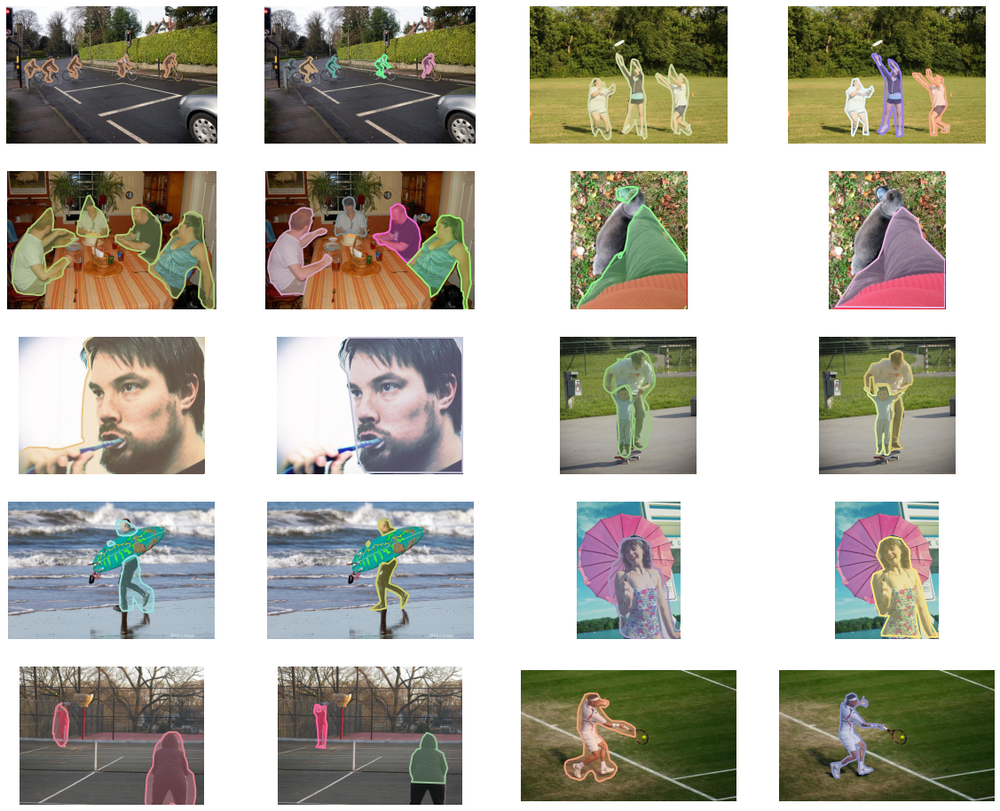

In [7]:
coco = COCO('/gdrive/My Drive/real/07_maciej_less_precise_contour-38.json')
show_anno_draw_p(coco, coco_train)
iou_cal(coco, coco_train)

loading annotations into memory...
Done (t=0.14s)
creating index...
index created!
0.5681870168371579


[0.5073143803477781,
 0.5904939472546477,
 0.5882926710316154,
 0.7737705308543456,
 0.5191710942585108,
 0.6715503782874985,
 0.4163732394366197,
 0.7134914411983341,
 0.43839640573699673,
 0.46301607996523253]

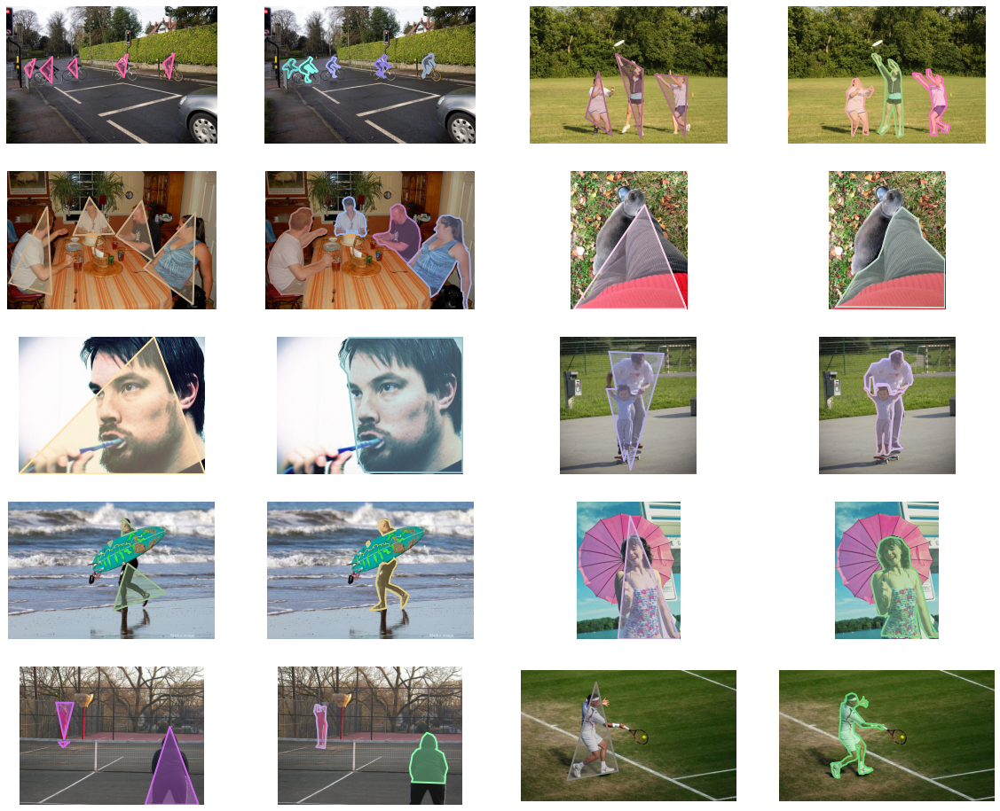

In [8]:
coco = COCO('/gdrive/My Drive/real/08_maciej_triangle-39.json')
show_anno_draw_p(coco, coco_train)
iou_cal(coco, coco_train)

loading annotations into memory...
Done (t=0.93s)
creating index...
index created!
0.7051859757839452


[0.6104375329467581,
 0.5454366737111122,
 0.5825255610144735,
 0.663001763302562,
 0.7169061819142146,
 0.8823659518986753,
 0.8619184274065703,
 0.7006153924722945,
 0.6433270253221591,
 0.8453252478506313]

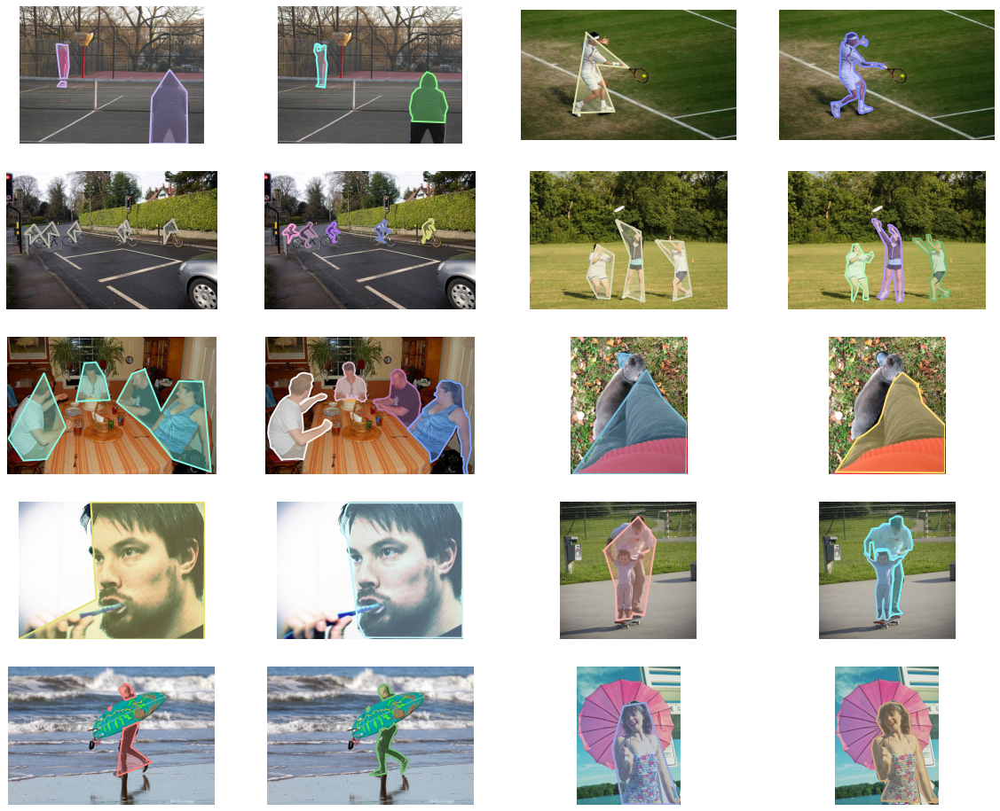

In [9]:
coco = COCO('/gdrive/My Drive/real/09_maciej_pentagon-40.json')
show_anno_draw_p(coco, coco_train)
iou_cal(coco, coco_train)

loading annotations into memory...
Done (t=0.15s)
creating index...
index created!
0.8280872549649945


[0.7376630743051616,
 0.7989502440222229,
 0.9159833398412078,
 0.9059340394800193,
 0.8460805034244943,
 0.8685687558465855,
 0.8287274713271436,
 0.8999442738666288,
 0.6509335925714861]

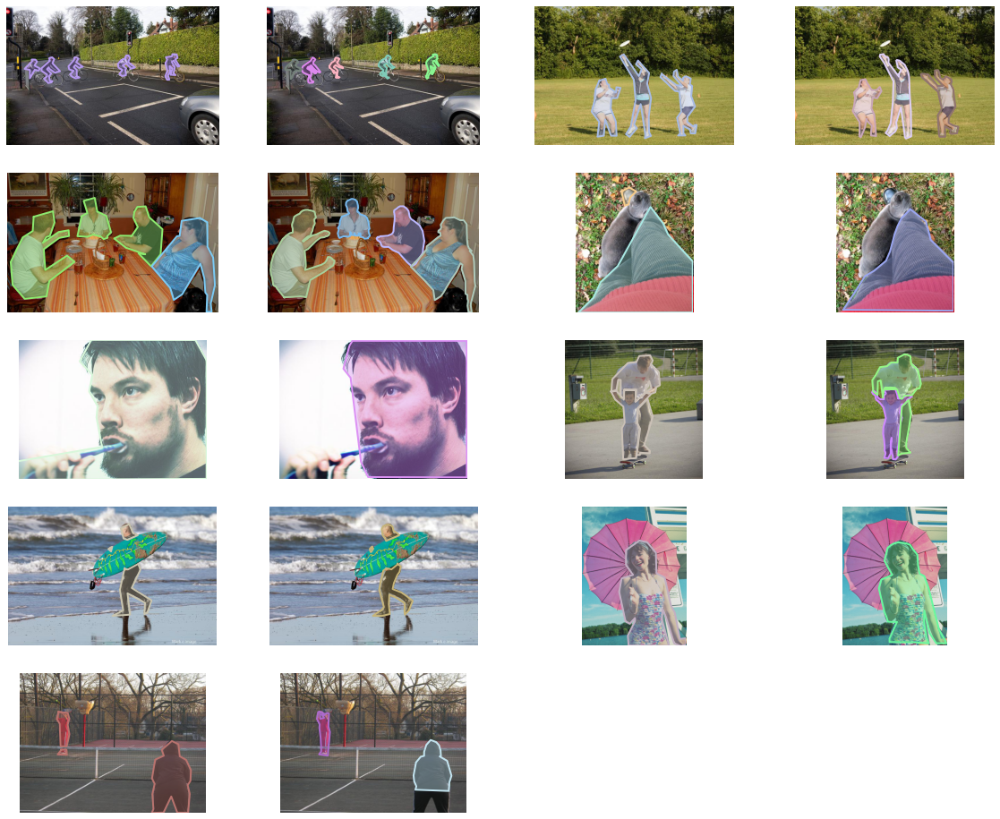

In [10]:
coco = COCO('/gdrive/My Drive/real/10_maciej_8_to_12_edge_polygon-41.json')
show_anno_draw_p(coco, coco_train)
iou_cal(coco, coco_train)

In [25]:
names = np.load('/gdrive/My Drive/real/a_10/names.npy',allow_pickle=True)
imgs = np.load('/gdrive/My Drive/real/a_10/imgs.npy',allow_pickle=True)
dataDir = '/gdrive/My Drive/real'
imgDir = '/gdrive/My Drive/real/a_10'
catIDs = coco.getCatIds()
cats = coco.loadCats(catIDs)
catIDs_train = coco_train.getCatIds()
cats_train = coco_train.loadCats(catIDs_train)
ids = coco.getImgIds(catIds=[4])
iouList = []
poly = 0
num = 0
lst = []
for i, id in enumerate(ids):
    index = eval(coco.loadImgs([id])[0]['file_name'][-5])

    annIds = coco.getAnnIds(imgIds=id, catIds=[4], iscrowd=None)
    anns = coco.loadAnns(annIds)
    x = anns[0]['segmentation']
    num += len(x)
    for ins in x:
        poly += len(ins)
        lst.append(len(ins))
    # mask = create_flatten_mask(coco, anns, imgs[index]['height'], imgs[index]['width'])
    # plt.imshow(mask.resize((imgs[index]['height'], imgs[index]['width'])))
    # break
print(num, poly, poly/num)

25 796 31.84


Text(0.5, 1.0, 'count of drawn edge number')

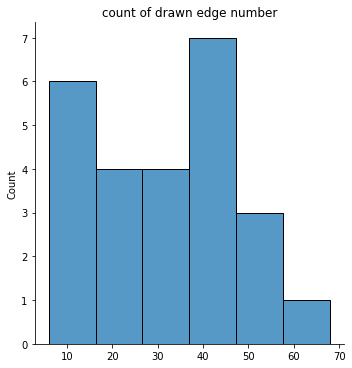

In [28]:
sns.displot(lst)
plt.title('count of drawn edge number')

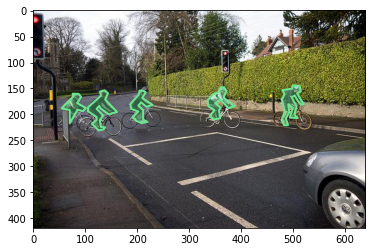

In [17]:
img = names[index]
I = Image.open('{}/{}'.format(imgDir, img))
plt.imshow(I)
annIds = coco.getAnnIds(imgIds=id, catIds=[4], iscrowd=None)
anns = coco.loadAnns(annIds)
coco.showAnns(anns)

In [20]:
print((anns[0]))

{'id': 567, 'image_id': 450, 'category_id': 4, 'segmentation': [[77.1, 165.4, 75.5, 160.1, 86.9, 160.4, 91.8, 166.5, 84.1, 178.2, 101.3, 187.7, 95.6, 193.6, 84.8, 191.1, 70.0, 217.0, 69.9, 191.4, 54.3, 188.4, 76.8, 165.6], [130.2, 164.2, 128.3, 156.2, 137.1, 153.5, 143.7, 159.2, 138.2, 171.2, 161.0, 195.3, 145.5, 200.1, 129.1, 188.3, 126.8, 183.8, 121.6, 189.3, 134.5, 202.2, 127.8, 210.6, 130.1, 224.2, 138.1, 225.0, 135.0, 229.0, 125.4, 230.8, 112.6, 217.9, 121.7, 210.8, 121.6, 205.2, 105.0, 194.0, 105.5, 185.9, 129.8, 164.2], [204.5, 154.3, 211.4, 154.1, 216.4, 157.4, 209.5, 168.2, 229.7, 181.8, 217.8, 185.3, 207.4, 176.9, 202.2, 183.0, 211.4, 191.5, 211.2, 209.9, 219.6, 214.5, 208.1, 216.8, 198.9, 212.9, 191.1, 205.6, 202.2, 194.3, 188.7, 189.8, 186.3, 180.7, 203.2, 161.2, 204.6, 154.3], [348.9, 191.8, 337.0, 184.4, 335.5, 173.2, 345.4, 161.5, 359.1, 155.9, 357.6, 153.4, 360.8, 147.7, 367.6, 147.7, 371.6, 155.2, 366.5, 167.5, 386.8, 184.0, 375.5, 187.8, 360.2, 171.5, 349.9, 177.9, 36

In [23]:
x = anns[0]['segmentation']
print(x)
print(len(x))
q = 0
for y in x:
    q += len(y)
print(q)

[[77.1, 165.4, 75.5, 160.1, 86.9, 160.4, 91.8, 166.5, 84.1, 178.2, 101.3, 187.7, 95.6, 193.6, 84.8, 191.1, 70.0, 217.0, 69.9, 191.4, 54.3, 188.4, 76.8, 165.6], [130.2, 164.2, 128.3, 156.2, 137.1, 153.5, 143.7, 159.2, 138.2, 171.2, 161.0, 195.3, 145.5, 200.1, 129.1, 188.3, 126.8, 183.8, 121.6, 189.3, 134.5, 202.2, 127.8, 210.6, 130.1, 224.2, 138.1, 225.0, 135.0, 229.0, 125.4, 230.8, 112.6, 217.9, 121.7, 210.8, 121.6, 205.2, 105.0, 194.0, 105.5, 185.9, 129.8, 164.2], [204.5, 154.3, 211.4, 154.1, 216.4, 157.4, 209.5, 168.2, 229.7, 181.8, 217.8, 185.3, 207.4, 176.9, 202.2, 183.0, 211.4, 191.5, 211.2, 209.9, 219.6, 214.5, 208.1, 216.8, 198.9, 212.9, 191.1, 205.6, 202.2, 194.3, 188.7, 189.8, 186.3, 180.7, 203.2, 161.2, 204.6, 154.3], [348.9, 191.8, 337.0, 184.4, 335.5, 173.2, 345.4, 161.5, 359.1, 155.9, 357.6, 153.4, 360.8, 147.7, 367.6, 147.7, 371.6, 155.2, 366.5, 167.5, 386.8, 184.0, 375.5, 187.8, 360.2, 171.5, 349.9, 177.9, 360.5, 187.1, 357.5, 191.9, 359.7, 207.5, 347.4, 209.8, 339.8, 20

loading annotations into memory...
Done (t=0.39s)
creating index...
index created!
0.8107161893575304


[0.7713877842357499,
 0.8815764582238571,
 0.6275289364840168,
 0.8175118323191346,
 0.7492381367000436,
 0.7750549893119365,
 0.8838210961084235,
 0.9147667738555479,
 0.8419161676646707,
 0.8443597186719235]

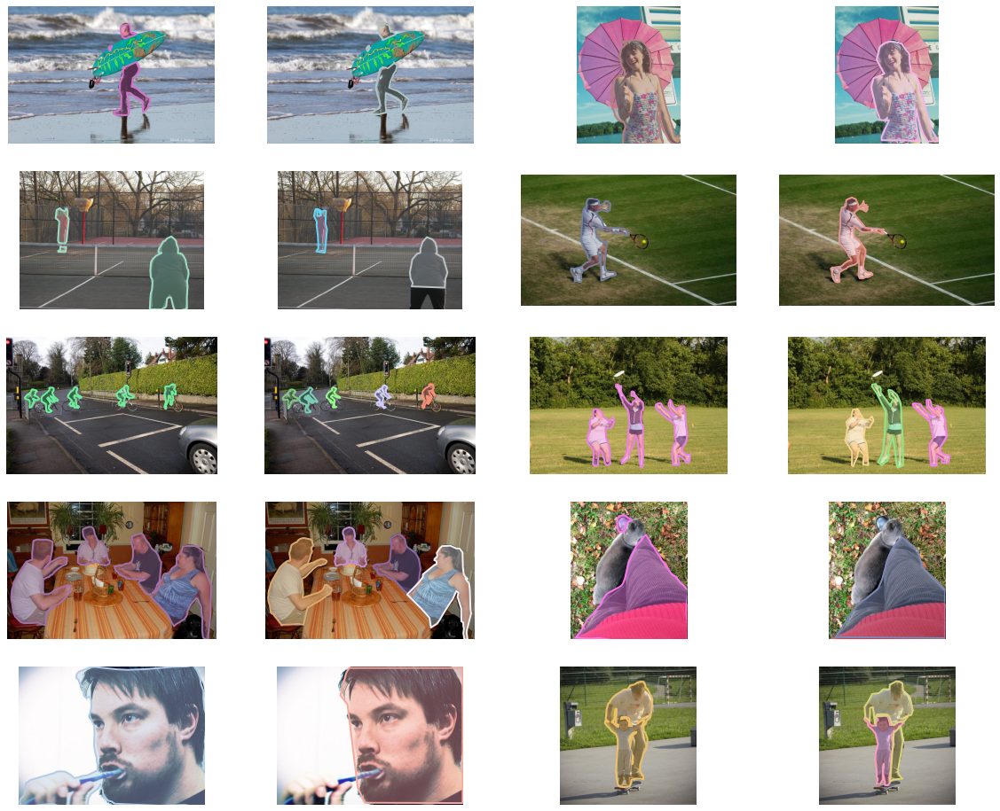

In [ ]:
coco = COCO('/gdrive/My Drive/real/06_maciej_approx_contour-37.json')
show_anno_draw_p(coco, coco_train)
iou_cal(coco, coco_train)

loading annotations into memory...
Done (t=0.36s)
creating index...
index created!
0.44464264700385303


[0.19228864754233652,
 0.4593342016781268,
 0.523596223468446,
 0.4552902843601896,
 0.5979867622724766,
 0.5447687586761161,
 0.23506029597400155,
 0.5758418329835443,
 0.5358705741944039,
 0.3263888888888889]

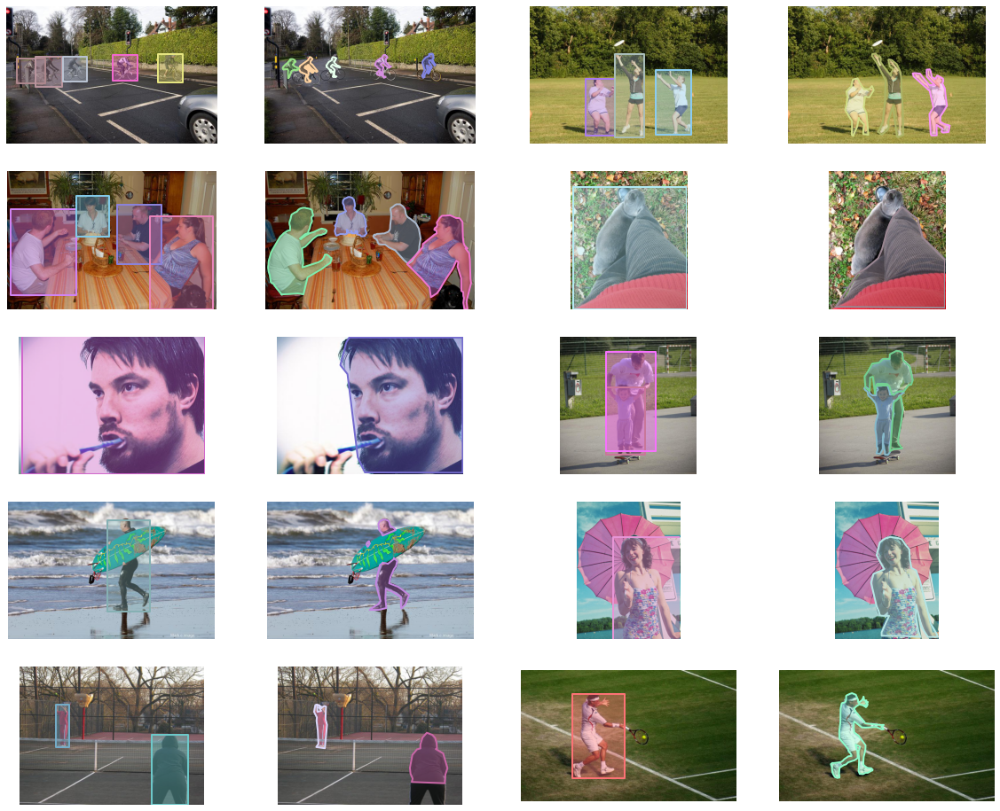

In [ ]:
coco = COCO('/gdrive/My Drive/real/04_maciej_individual_bounding_box-35.json')
show_anno_draw_p(coco, coco_train)
iou_cal(coco, coco_train)


loading annotations into memory...
Done (t=0.34s)
creating index...
index created!
0.41860294725379443


[0.15414967427572693,
 0.34523178284953576,
 0.4584167801962545,
 0.4409262651705977,
 0.5992096390869397,
 0.5393138311847148,
 0.24110857048403536,
 0.5825032481593764,
 0.49854370120175245,
 0.326625979929011]

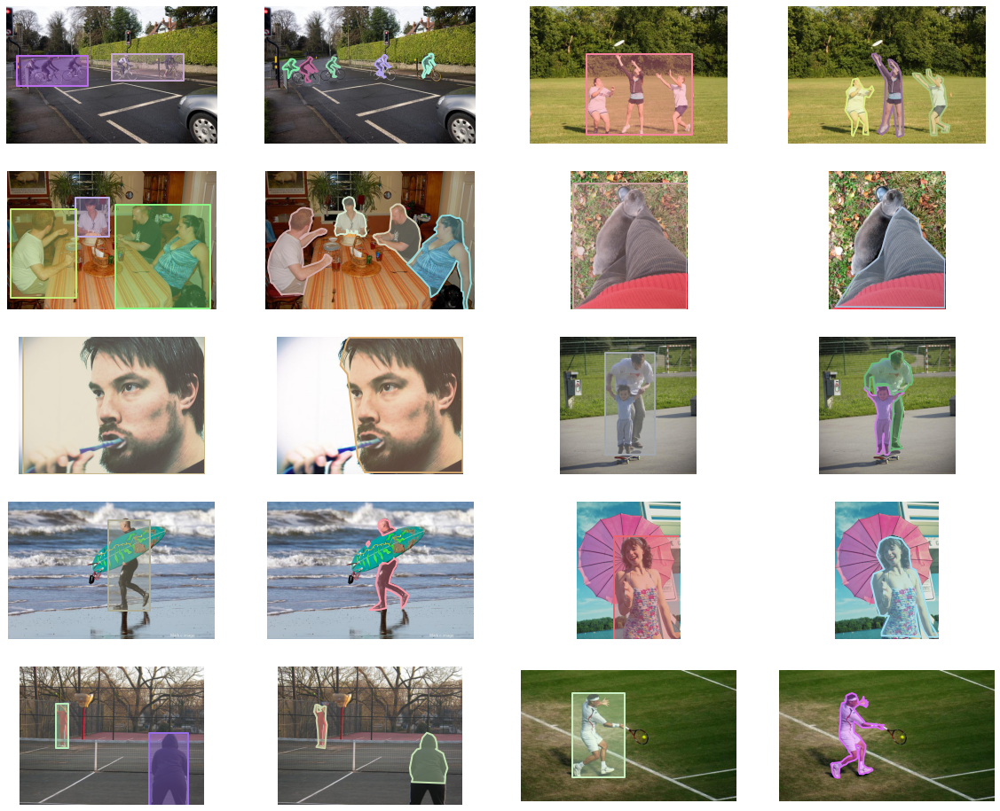

In [ ]:
coco = COCO('/gdrive/My Drive/real/05_maciej_multiple_bounding_box-36.json')
show_anno_draw_p(coco, coco_train)
iou_cal(coco, coco_train)


In [ ]:
iouListAll = []
jsonList = np.load('/gdrive/My Drive/real/a_10/json.npy',allow_pickle=True)
for js in jsonList:
    print(js)
    coco = COCO('/gdrive/My Drive/real/{}'.format(js))
    x = iou_cal(coco, coco_train)
    iouListAll.append(x)

01_chris_perfect-1.json
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
0.8328581341878211
01_shen_approx_contour-12.json
loading annotations into memory...
Done (t=0.37s)
creating index...
index created!
0.7279875203866613
01_xian_triangle-21.json
loading annotations into memory...
Done (t=0.34s)
creating index...
index created!
0.46091564602965124
02_chris_individual_bounding_box-2.json
loading annotations into memory...
Done (t=0.36s)
creating index...
index created!
0.45733205086282397
02_shen_less_precise_contour-13.json
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
0.6619882591969456
02_xian_pentagon-22.json
loading annotations into memory...
Done (t=0.34s)
creating index...
index created!
0.5847619185497186
03_chris_multiple_bounding_box-3.json
loading annotations into memory...
Done (t=0.31s)
creating index...
index created!
0.45208295834593476
03_shen_triangle-14.json
loading annotations into memory...
Don

In [ ]:
for i, n in zip(iouListAll, jsonList):
    print(n[:-5], np.round(np.mean(i),3))

01_chris_perfect-1 0.833
01_shen_approx_contour-12 0.728
01_xian_triangle-21 0.461
02_chris_individual_bounding_box-2 0.457
02_shen_less_precise_contour-13 0.662
02_xian_pentagon-22 0.585
03_chris_multiple_bounding_box-3 0.452
03_shen_triangle-14 0.532
03_xian_8_to_12_edges-24 0.693
04_chris_approx_contour-4 0.817
04_shen_pentagon-15 0.618
04_xian_one_point-25 0.003
05_chris_less_precise_contour-5 0.775
05_shen_8_to_12_edge_polygon-16 0.758
05_xian_scribble-26 0.033
06_chris_triangle-6 0.509
06_shen_one_point-17 0.003
06_xian_perfect-27 0.817
07_chris_pentagon-7 0.682
07_shen_scribble-18 0.047
07_xian_individual_bounding_box-28 0.498
08_chris_8_to_12_edge_polygon-8 0.766
08_shen_perfect-19 0.839
08_xian_multiple_bounding_box-29 0.391
09_chris_one_point-9 0.003
09_shen_individual_bounding_box-20 0.413
09_xian_approx_contour-30 0.739
10_chris_scribble-10 0.08
10_shen_multiple_bounding_box-11 0.442
10_xian_less_precise_contour-31 0.643


In [ ]:
def read_until(stri, sign):
    pos = stri.index(sign)
    return stri[pos+1:], stri[:pos]

def collect_data(jsonList, iouListAll, df):
    for js, iou in zip(jsonList, iouListAll):
        js, temp = read_until(js, '_')
        js, person = read_until(js, '_')
        js, cata = read_until(js, '-')
        df.loc[cata, person] = np.mean(iou)
        df.loc[cata, person+'_detail'] = str(iou)
    return df

In [ ]:
df = x.copy()
for js, iou in zip(jsonList, iouListAll):
    js, temp = read_until(js, '_')
    js, person = read_until(js, '_')
    js, cata = read_until(js, '-')
    df.loc[cata, person] = np.mean(iou)
    df.loc[cata, person+'_detail'] = str(iou)

In [ ]:
print(df)

                            chris  \
perfect                  0.832858   
approx_contour           0.816609   
less_precise_contour     0.775368   
triangle                 0.509022   
pentagon                 0.682283   
8_to_12_edges                 NaN   
individual_bounding_box  0.457332   
multiple_bounding_box    0.452083   
one_point                0.003067   
scribble                 0.080312   
8_to_12_edge_polygon     0.765697   

                                                              chris_detail  \
perfect                  [0.8511361136683966, 0.8985635779104573, 0.806...   
approx_contour           [0.8132972972972973, 0.9006071704982722, 0.649...   
less_precise_contour     [0.5795496043822276, 0.7546152440138915, 0.851...   
triangle                 [0.33964411338713013, 0.45413352129694895, 0.4...   
pentagon                 [0.5722062320110124, 0.5096949327817993, 0.570...   
8_to_12_edges                                                          NaN   
individua

In [ ]:
df.to_excel('/gdrive/My Drive/real/a_10/re.xlsx')

In [ ]:
df['chris_detail'][cata]='3'
print(df)

                            chris  \
perfect                  0.832858   
approx_contour           0.816609   
less_precise_contour     0.775368   
triangle                 0.509022   
pentagon                 0.682283   
8_to_12_edges                 NaN   
individual_bounding_box  0.457332   
multiple_bounding_box    0.452083   
one_point                0.003067   
scribble                 0.080312   

                                                              chris_detail  \
perfect                  [0.8511361136683966, 0.8985635779104573, 0.806...   
approx_contour           [0.8132972972972973, 0.9006071704982722, 0.649...   
less_precise_contour     [0.5795496043822276, 0.7546152440138915, 0.851...   
triangle                 [0.33964411338713013, 0.45413352129694895, 0.4...   
pentagon                 [0.5722062320110124, 0.5096949327817993, 0.570...   
8_to_12_edges                                                            3   
individual_bounding_box  [0.3395381715362865, 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
coco = COCO('/gdrive/My Drive/real/02_shen_less_precise_contour-13.json')
coco_train = COCO('/gdrive/My Drive/anno/instances_train2017.json')

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=38.72s)
creating index...
index created!


In [ ]:
x=pd.read_excel('/gdrive/My Drive/real/a_10/com3.xlsx', index_col=0)
print(x)

                perfect  individual_bounding_box  multiple_bounding_box  \
shen_time    767.800000                45.300000             101.800000   
xian_time    539.300000                30.100000              34.800000   
chris_time  1143.700000               271.200000             214.300000   
shen_acc       0.839284                 0.441726               0.412986   
xian_acc       0.816536                 0.497900               0.391153   
chris_acc      0.832858                 0.457332               0.452083   
NaN                 NaN                      NaN                    NaN   
shen_eff       0.001093                 0.009751               0.004057   
xian_eff       0.001514                 0.016542               0.011240   
chris_eff      0.000728                 0.001686               0.002110   
xian/shen      1.385109                 1.696370               2.770634   
chris/shen     0.666190                 0.172937               0.520006   

            approx_conto

In [136]:
x=pd.read_excel('/gdrive/My Drive/real/a_10/test_record.xlsx', index_col=0)
# print(x)

In [138]:
name = x.columns.values
v50 = x.loc['iou5'].values
v100 = x.loc['iou10'].values
v104 = x.loc['iou104'].values
v150 = x.loc['iou15'].values
iou = x.loc['IoU'].values
v150[1] = 0.491
print(v150)

[0.491 0.491 0.491 0.451 0.444 0.555 0.555 0.4 0.503 0.555]


In [140]:
print(iou)
iou[2] = 1
print(iou)

[0.83 0.83 nan 0.47 0.42 0.76 0.69 0.5 0.63 0.74]
[0.83 0.83 1 0.47 0.42 0.76 0.69 0.5 0.63 0.74]


In [141]:
iou2 = iou.copy()
iou2 = iou2[1:]
iou2[-1] = 0.92
print(iou)
print(iou2)

[0.83 0.83 1 0.47 0.42 0.76 0.69 0.5 0.63 0.74]
[0.83 1 0.47 0.42 0.76 0.69 0.5 0.63 0.92]


Text(0.5, 1.0, 'under several certain annotation time - others')

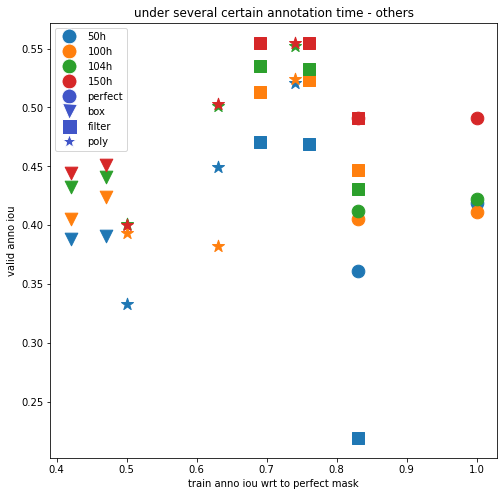

In [142]:
from matplotlib.lines import Line2D
cmap = plt.cm.coolwarm
m = ['s', 'o', 'o', 'v', 'v', 's', 's', '*', '*', '*']
c = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
custom_lines = [Line2D([0], [0], marker='o', color='w', label = '50h', markerfacecolor=c[0], markersize=15),
                Line2D([0], [0], marker='o', color='w', label = '100h', markerfacecolor=c[1], markersize=15),
                Line2D([0], [0], marker='o', color='w', label = '104h', markerfacecolor=c[2], markersize=15),
                Line2D([0], [0], marker='o', color='w', label = '150h', markerfacecolor=c[3], markersize=15),
                Line2D([0], [0], marker='o', color='w', label = 'perfect', markerfacecolor=cmap(5), markersize=15),
                Line2D([0], [0], marker='v', color='w', label = 'box', markerfacecolor=cmap(5), markersize=15),
                Line2D([0], [0], marker='s', color='w', label = 'filter', markerfacecolor=cmap(5), markersize=15),
                Line2D([0], [0], marker='*', color='w', label = 'poly', markerfacecolor=cmap(5), markersize=15)]
fig, ax = plt.subplots(figsize=(8,8))
for i in range(10):
    ax.scatter(iou[i], v50[i], marker=m[i], s=160, color=c[0])
    ax.scatter(iou[i], v100[i], marker=m[i], s=160, color=c[1])
    ax.scatter(iou[i], v104[i], marker=m[i], s=160, color=c[2])
    ax.scatter(iou[i], v150[i], marker=m[i], s=160, color=c[3])
ax.legend(handles=custom_lines)
ax.set_xlabel('train anno iou wrt to perfect mask')
ax.set_ylabel('valid anno iou')
ax.set_title('under several certain annotation time - others')

In [58]:
y=pd.read_excel('/gdrive/My Drive/real/a_10/mm.xlsx', index_col=0)
print(y)

              Filter_5      perfect          box1          box2     Filter_7  \
generated                                                                      
time       1601.500000  1601.500000    178.600000    120.300000   373.700000   
100h       2247.892601  2247.892601  20156.774916  29925.187032  9633.395772   
iou100        0.460000     0.495000      0.407000      0.401000     0.483000   
50h        1123.946300  1123.946300  10078.387458  14962.593516  4816.697886   
iou50         0.441000     0.409000      0.387000      0.400000     0.474000   

               Filter_9        Poly_3        Poly_5       Poly_8  
generated                                                         
time         158.600000    268.300000    287.600000   587.800000  
100h       22698.612863  13417.815878  12517.385257  6124.532154  
iou100         0.532000      0.367000      0.474000     0.491000  
50h        11349.306431   6708.907939   6258.692629  3062.266077  
iou50          0.498000      0.301000

In [59]:
m50 = y.loc['iou50'].values
m100 = y.loc['iou100'].values

In [122]:
print(iou2)
iou2[1] = 1
print(iou2)

[0.83 1 0.47 0.42 0.76 0.69 0.5 0.63 0.91]
[0.83 1 0.47 0.42 0.76 0.69 0.5 0.63 0.91]


In [127]:
print(iou)
iou[1] = 0.83
print(iou)

[0.83 1 1 0.47 0.42 0.76 0.69 0.5 0.63 0.91]
[0.83 0.83 1 0.47 0.42 0.76 0.69 0.5 0.63 0.91]


In [130]:
iou[-1] = 0.74
print(iou)
print(iou2)

[0.83 0.83 1 0.47 0.42 0.76 0.69 0.5 0.63 0.74]
[0.83 1 0.47 0.42 0.76 0.69 0.5 0.63 0.74]


Text(0.5, 1.0, 'under several certain annotation time - maciej')

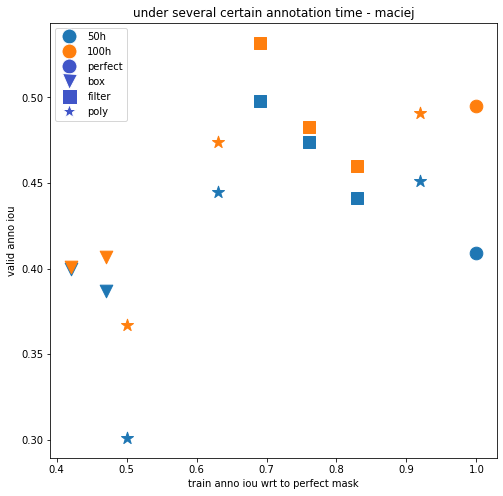

In [143]:
m2 = ['s', 'o', 'v', 'v', 's', 's', '*', '*', '*']
# iou2 = iou[1:]
c = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
custom_lines = [Line2D([0], [0], marker='o', color='w', label = '50h', markerfacecolor=c[0], markersize=15),
                Line2D([0], [0], marker='o', color='w', label = '100h', markerfacecolor=c[1], markersize=15),
                Line2D([0], [0], marker='o', color='w', label = 'perfect', markerfacecolor=cmap(5), markersize=15),
                Line2D([0], [0], marker='v', color='w', label = 'box', markerfacecolor=cmap(5), markersize=15),
                Line2D([0], [0], marker='s', color='w', label = 'filter', markerfacecolor=cmap(5), markersize=15),
                Line2D([0], [0], marker='*', color='w', label = 'poly', markerfacecolor=cmap(5), markersize=15)]
fig, ax = plt.subplots(figsize=(8,8))
for i in range(9):
    ax.scatter(iou2[i], m50[i], marker=m2[i], s=160, color=c[0])
    ax.scatter(iou2[i], m100[i], marker=m2[i], s=160, color=c[1])
ax.legend(handles=custom_lines)
ax.set_xlabel('train anno iou wrt to perfect mask')
ax.set_ylabel('valid anno iou')
ax.set_title('under several certain annotation time - maciej')

Text(0.5, 1.0, 'under 50h annotation time')

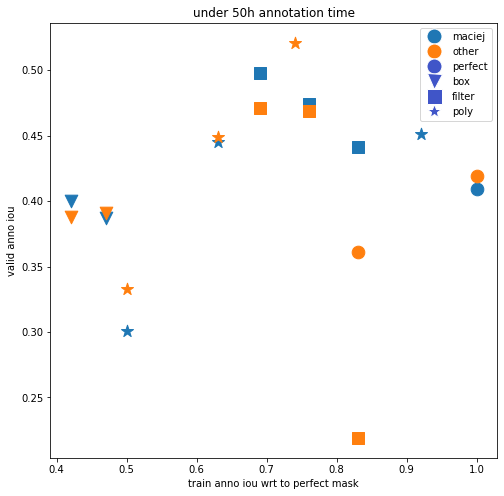

In [144]:
custom_lines = [Line2D([0], [0], marker='o', color='w', label = 'maciej', markerfacecolor=c[0], markersize=15),
                Line2D([0], [0], marker='o', color='w', label = 'other', markerfacecolor=c[1], markersize=15),
                Line2D([0], [0], marker='o', color='w', label = 'perfect', markerfacecolor=cmap(5), markersize=15),
                Line2D([0], [0], marker='v', color='w', label = 'box', markerfacecolor=cmap(5), markersize=15),
                Line2D([0], [0], marker='s', color='w', label = 'filter', markerfacecolor=cmap(5), markersize=15),
                Line2D([0], [0], marker='*', color='w', label = 'poly', markerfacecolor=cmap(5), markersize=15)]
fig, ax = plt.subplots(figsize=(8,8))
for i in range(9):
    ax.scatter(iou2[i], m50[i], marker=m2[i], s=160, color=c[0])
for i in range(10):
    ax.scatter(iou[i], v50[i], marker=m[i], s=160, color=c[1])
ax.legend(handles=custom_lines)
ax.set_xlabel('train anno iou wrt to perfect mask')
ax.set_ylabel('valid anno iou')
ax.set_title('under 50h annotation time')

Text(0.5, 1.0, 'under 100h annotation time')

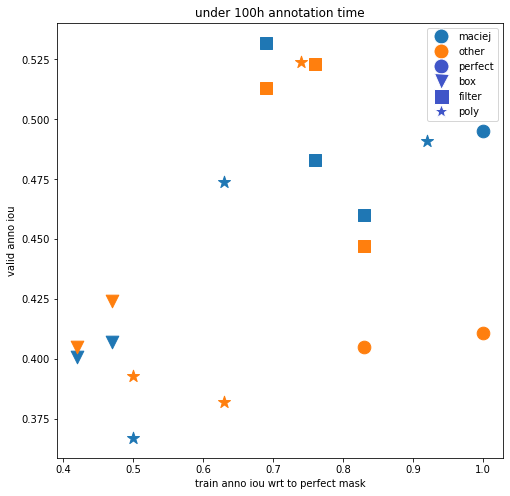

In [145]:
fig, ax = plt.subplots(figsize=(8,8))
for i in range(9):
    ax.scatter(iou2[i], m100[i], marker=m2[i], s=160, color=c[0])
for i in range(10):
    ax.scatter(iou[i], v100[i], marker=m[i], s=160, color=c[1])
ax.legend(handles=custom_lines)
ax.set_xlabel('train anno iou wrt to perfect mask')
ax.set_ylabel('valid anno iou')
ax.set_title('under 100h annotation time')

Text(0.5, 1.0, 'under several certain annotation time')

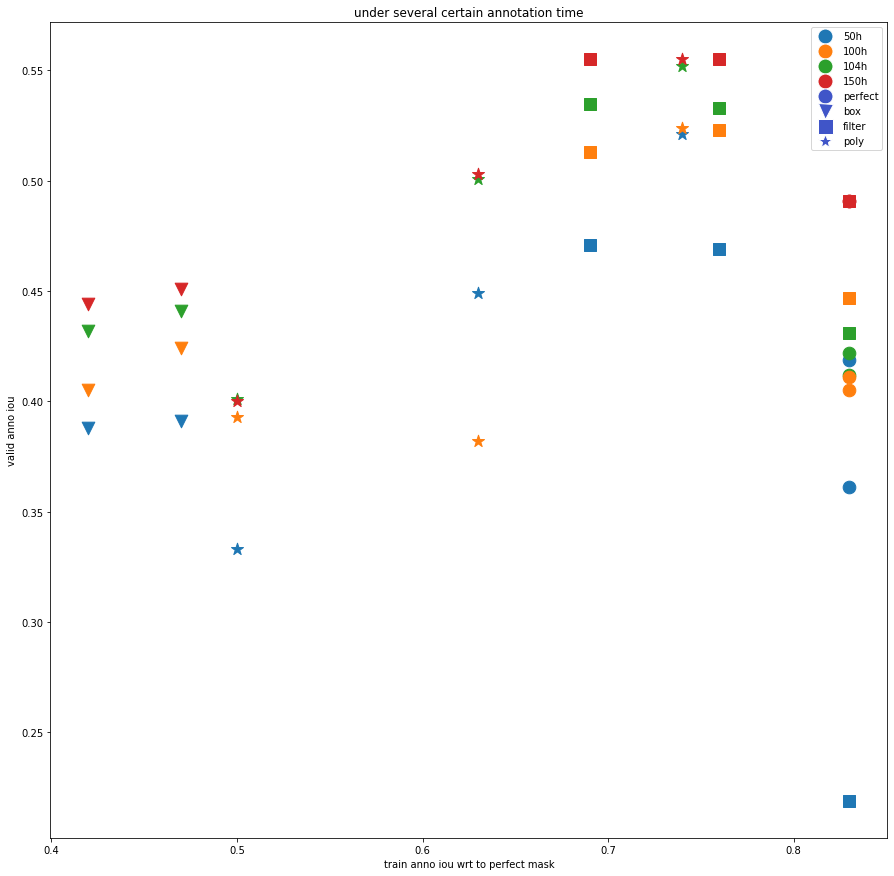

In [ ]:

from matplotlib.lines import Line2D
cmap = plt.cm.coolwarm
m = ['s', 'o', 'o', 'v', 'v', 's', 's', '*', '*', '*']
c = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
custom_lines = [Line2D([0], [0], marker='o', color='w', label = '50h', markerfacecolor=c[0], markersize=15),
                Line2D([0], [0], marker='o', color='w', label = '100h', markerfacecolor=c[1], markersize=15),
                Line2D([0], [0], marker='o', color='w', label = '104h', markerfacecolor=c[2], markersize=15),
                Line2D([0], [0], marker='o', color='w', label = '150h', markerfacecolor=c[3], markersize=15),
                Line2D([0], [0], marker='o', color='w', label = 'perfect', markerfacecolor=cmap(5), markersize=15),
                Line2D([0], [0], marker='v', color='w', label = 'box', markerfacecolor=cmap(5), markersize=15),
                Line2D([0], [0], marker='s', color='w', label = 'filter', markerfacecolor=cmap(5), markersize=15),
                Line2D([0], [0], marker='*', color='w', label = 'poly', markerfacecolor=cmap(5), markersize=15)]
fig, ax = plt.subplots(figsize=(15,15))
for i in range(10):
    ax.scatter(iou[i], v50[i], marker=m[i], s=160, color=c[0])
    ax.scatter(iou[i], v100[i], marker=m[i], s=160, color=c[1])
    ax.scatter(iou[i], v104[i], marker=m[i], s=160, color=c[2])
    ax.scatter(iou[i], v150[i], marker=m[i], s=160, color=c[3])
ax.legend(handles=custom_lines)
ax.set_xlabel('train anno iou wrt to perfect mask')
ax.set_ylabel('valid anno iou')
ax.set_title('under several certain annotation time')
  

In [ ]:
z = x.sort_values(by='IoU', axis = 1)
print(z)

          multiple_bounding_box individual_bounding_box      triangle  \
IoU                        0.42                    0.47           0.5   
generated                    #3                      #2        Poly_3   
Ave_time                 116.97                  115.53        148.93   
104h                      32146                   32545         25246   
iou104                    0.432                   0.441         0.401   
50h                 15388.56117            15580.368735     12086.215   
iou5                      0.388                   0.391         0.333   
100h               30777.122339            31160.737471  24172.430001   
iou10                     0.405                   0.424         0.393   
150h               46165.683509            46741.106206  36258.645001   
iou15                     0.444                   0.451           0.4   

               pentagon less_precise_contour 8_to_12_edges2 approx_contour  \
IoU                0.63                 0.69 

In [ ]:
name = z.columns.values
v50 = z.loc['iou5'].values
v100 = z.loc['iou10'].values
v104 = z.loc['iou104'].values
v150 = z.loc['iou15'].values
iou = z.loc['IoU'].values
v150[1] = 0.491
print(v150)
temp = v50[-3]
v50[-3] = v50[-1]
v50[-1] = temp

[0.444 0.491 0.4 0.503 0.555 0.555 0.555 0.491 0.491 0.491]


Text(0, 0.5, 'valid anno iou')

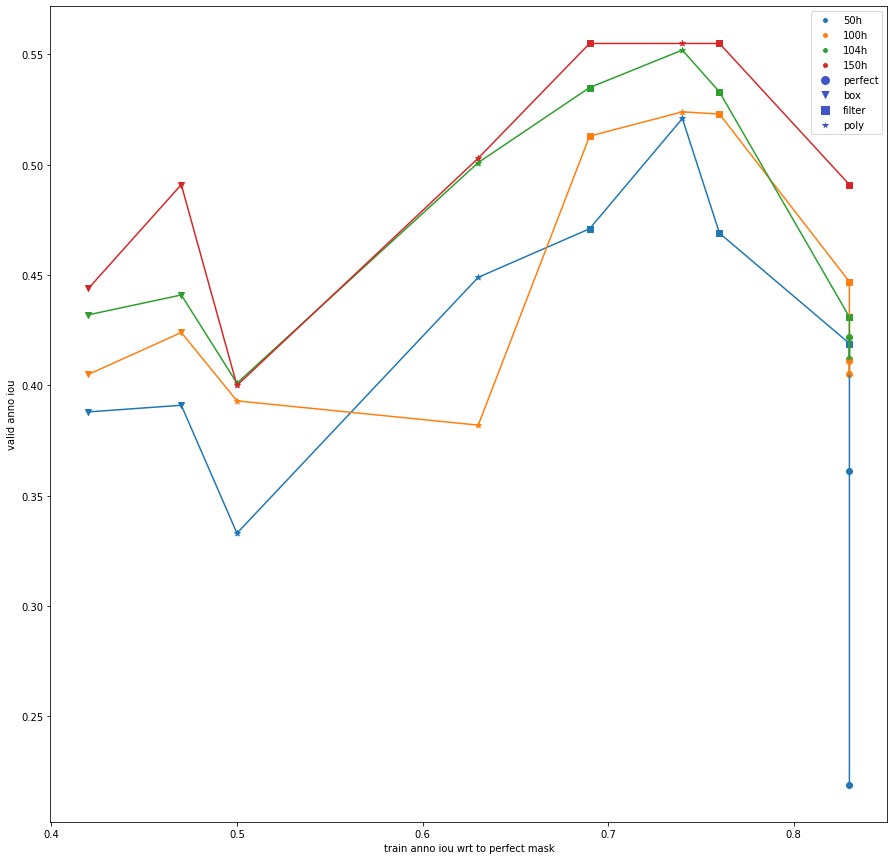

In [ ]:
m = ['v', 'v', '*', '*', 's', '*', 's', 's', 'o', 'o']
c = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
custom_lines = [Line2D([0], [0], marker='o', color='w', label = '50h', markerfacecolor=c[0]),
                Line2D([0], [0], marker='o', color='w', label = '100h', markerfacecolor=c[1]),
                Line2D([0], [0], marker='o', color='w', label = '104h', markerfacecolor=c[2]),
                Line2D([0], [0], marker='o', color='w', label = '150h', markerfacecolor=c[3]),
                Line2D([0], [0], marker='o', color='w', label = 'perfect', markerfacecolor=cmap(5), markersize=10),
                Line2D([0], [0], marker='v', color='w', label = 'box', markerfacecolor=cmap(5), markersize=10),
                Line2D([0], [0], marker='s', color='w', label = 'filter', markerfacecolor=cmap(5), markersize=10),
                Line2D([0], [0], marker='*', color='w', label = 'poly', markerfacecolor=cmap(5), markersize=10)]
fig, ax = plt.subplots(figsize=(15,15))
for i in range(10):
    ax.scatter(iou[i], v50[i], marker=m[i], color=c[0])
    ax.scatter(iou[i], v100[i], marker=m[i], color=c[1])
    ax.scatter(iou[i], v104[i], marker=m[i], color=c[2])
    ax.scatter(iou[i], v150[i], marker=m[i], color=c[3])
ax.plot(iou, v50, color=c[0])
ax.plot(iou, v100, color=c[1])
ax.plot(iou, v104, color=c[2])
ax.plot(iou, v150, color=c[3])
ax.legend(handles=custom_lines)
ax.set_xlabel('train anno iou wrt to perfect mask')
ax.set_ylabel('valid anno iou')

In [ ]:
x=pd.read_excel('/gdrive/My Drive/real/a_10/com3.xlsx', index_col=0)
print(x)

In [41]:
print(t[0])
print(t[1])
print(np.hstack((t[0],t[1])))

[767.8000000000001 45.3 101.8 424.1 285.6999999999999 136.5 143.7 230.7
 28.3 38.2]
[539.3000000000001 30.1 34.8 147.0 84.8 152.7 152.6 194.5 22.5 26.5]
[767.8000000000001 45.3 101.8 424.1 285.6999999999999 136.5 143.7 230.7
 28.3 38.2 539.3000000000001 30.1 34.8 147.0 84.8 152.7 152.6 194.5 22.5
 26.5]


Text(0.5, 1.0, 'real annotation info')

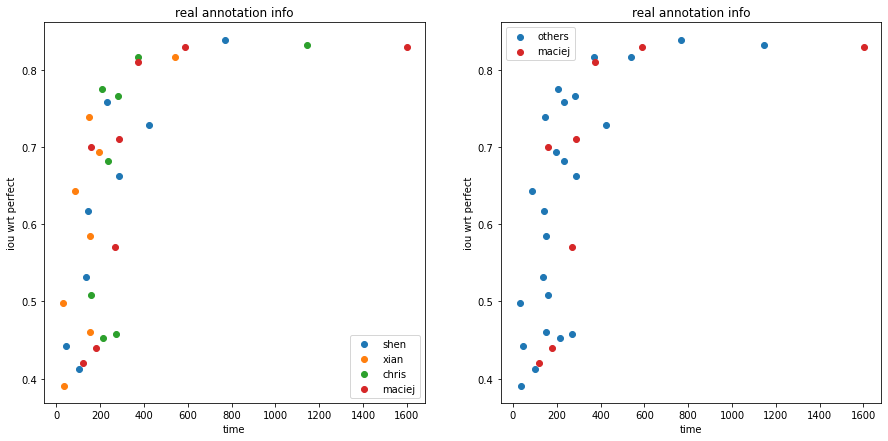

In [52]:
ts = x.loc['shen_time'].values
tx = x.loc['xian_time'].values
tc = x.loc['chris_time'].values
tm = x.loc['maciej_time'].values
acs = x.loc['shen_acc'].values
acx = x.loc['xian_acc'].values
acc = x.loc['chris_acc'].values
acm = x.loc['maciej_acc'].values
t = [ts, tx, tc, tm]
a = [acs, acx, acc, acm]
p = ['shen', 'xian', 'chris', 'maciej']
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.scatter(t[0], a[0], label = p[0])
plt.scatter(t[1], a[1], label = p[1])
plt.scatter(t[2], a[2], label = p[2])
plt.scatter(t[3], a[3], label = p[3])
plt.xlabel('time')
plt.ylabel('iou wrt perfect')
plt.legend()
plt.title('real annotation info')
plt.subplot(1,2,2)
plt.scatter(np.hstack((t[0],t[1],t[2])), np.hstack((a[0],a[1],a[2])), label = 'others')
plt.scatter(t[3], a[3], color = colorList[3], label = p[3])
plt.xlabel('time')
plt.ylabel('iou wrt perfect')
plt.legend()
plt.title('real annotation info')

Text(0.5, 1.0, 'time vs anno acc')

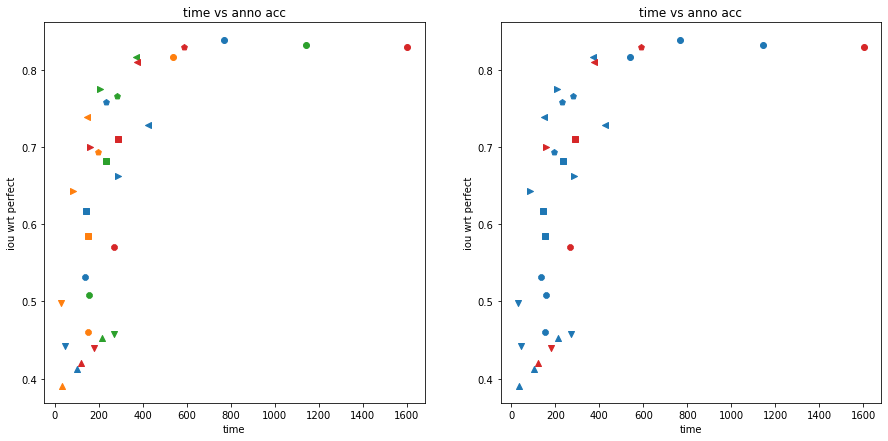

In [51]:
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
# 'o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X'
# ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
m = ['o', 'v', '^', '<', '>', '8', 's', 'p', '*']
colorList = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
for i, mk, name in zip(np.arange(9), m,n):
    plt.scatter(t[0][i], a[0][i], marker = mk, color = colorList[0], label = p[0]+'_'+name)
    plt.scatter(t[1][i], a[1][i], marker = mk, color = colorList[1], label = p[1]+'_'+name)
    plt.scatter(t[2][i], a[2][i], marker = mk, color = colorList[2], label = p[2]+'_'+name)
    plt.scatter(t[3][i], a[3][i], marker = mk, color = colorList[3], label = p[3]+'_'+name)
    plt.xlabel('time')
    plt.ylabel('iou wrt perfect')
    # plt.legend()
plt.title('time vs anno acc')
plt.subplot(1,2,2)
for i, mk, name in zip(np.arange(9), m,n):
    plt.scatter(t[0][i], a[0][i], marker = mk, color = colorList[0], label = p[0]+'_'+name)
    plt.scatter(t[1][i], a[1][i], marker = mk, color = colorList[0], label = p[1]+'_'+name)
    plt.scatter(t[2][i], a[2][i], marker = mk, color = colorList[0], label = p[2]+'_'+name)
    plt.scatter(t[3][i], a[3][i], marker = mk, color = colorList[3], label = p[3]+'_'+name)
    plt.xlabel('time')
    plt.ylabel('iou wrt perfect')
    # plt.legend()
plt.title('time vs anno acc')

In [ ]:
y=pd.read_excel('/gdrive/My Drive/real/a_10/re.xlsx', index_col=0)
print(y)

In [ ]:
print(x)

In [ ]:
ts = x.loc['shen_time'].values
tx = x.loc['xian_time'].values
tc = x.loc['chris_time'].values
acs = x.loc['shen_acc'].values
acx = x.loc['xian_acc'].values
acc = x.loc['chris_acc'].values
t = [ts, tx, tc]
a = [acs, acx, acc]
p = ['shen', 'xian', 'chris']

In [47]:
n = x.columns.values
print(n)

['perfect' 'individual_bounding_box' 'multiple_bounding_box'
 'approx_contour' 'less_precise_contour' 'triangle' 'pentagon'
 '8_to_12_edges' 'one_point' 'scribble']


Text(0.5, 1.0, 'all annotation')

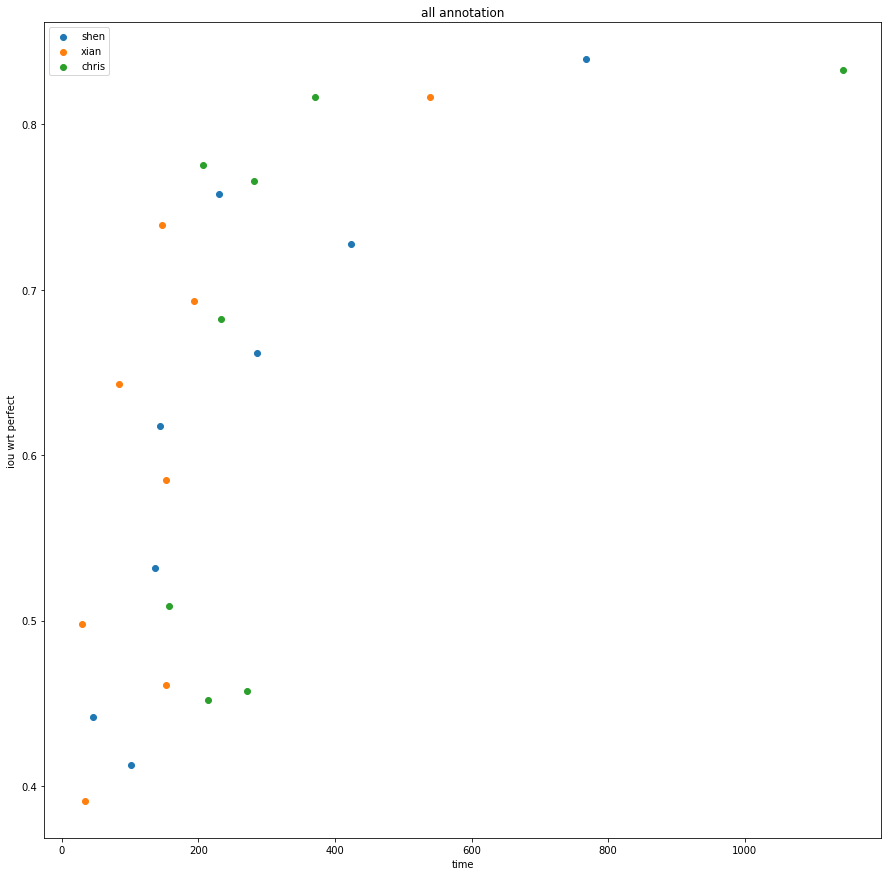

In [ ]:
plt.figure(figsize=(15,15))
plt.scatter(t[0], a[0], label = p[0])
plt.scatter(t[1], a[1], label = p[1])
plt.scatter(t[2], a[2], label = p[2])
plt.xlabel('time')
plt.ylabel('iou wrt perfect')
plt.legend()
plt.title('all annotation')

Text(0.5, 1.0, 'time vs anno acc')

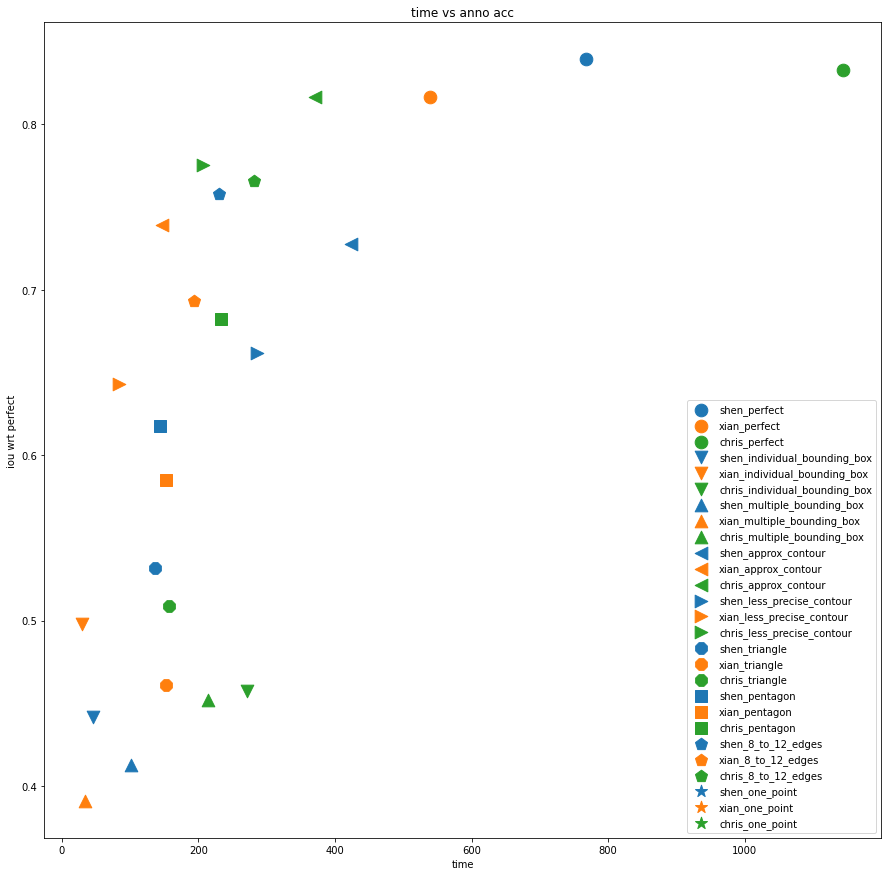

In [ ]:
plt.figure(figsize=(15,15))
# 'o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X'
# ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
m = ['o', 'v', '^', '<', '>', '8', 's', 'p', '*']
colorList = ['#1f77b4', '#ff7f0e', '#2ca02c']
for i, mk, name in zip(np.arange(9), m,n):
    plt.scatter(t[0][i], a[0][i], marker = mk, s=160, color = colorList[0], label = p[0]+'_'+name)
    plt.scatter(t[1][i], a[1][i], marker = mk, s=160, color = colorList[1], label = p[1]+'_'+name)
    plt.scatter(t[2][i], a[2][i], marker = mk, s=160, color = colorList[2], label = p[2]+'_'+name)
    plt.xlabel('time')
    plt.ylabel('iou wrt perfect')
    plt.legend()
plt.title('time vs anno acc')

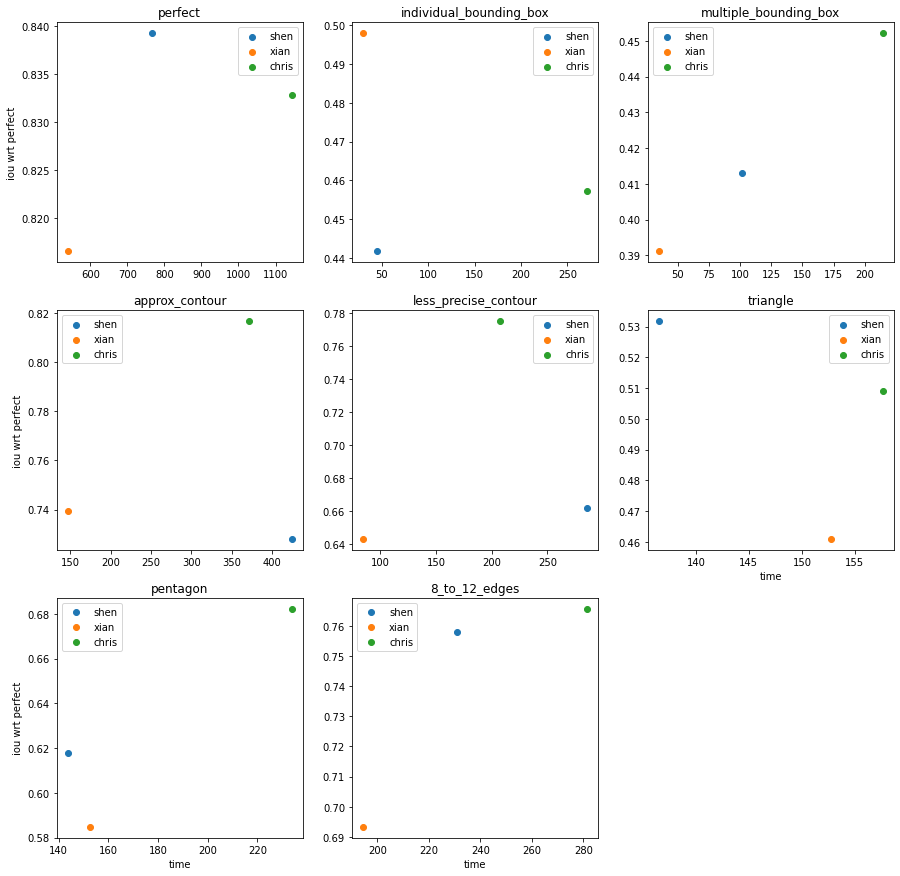

In [ ]:
plt.figure(figsize=(15,15))
for i, name in enumerate(n):
    plt.subplot(3,3,i+1)
    plt.scatter(t[0][i], a[0][i], label = p[0])
    plt.scatter(t[1][i], a[1][i], label = p[1])
    plt.scatter(t[2][i], a[2][i], label = p[2])
    if i > 4:
        plt.xlabel('time')
    if i%3 == 0:
        plt.ylabel('iou wrt perfect')
    plt.legend()
    plt.title(name)

In [ ]:
y=pd.read_excel('/gdrive/My Drive/real/a_10/real-valid.xlsx', index_col=0)
print(y)

            perfect perfect2 perfect3 individual_bounding_box  \
IoU            0.83     0.83     0.83                    0.47   
generated  Filter_5       #1  perfect                      #2   
Ave_time     816.93   816.93   816.93                  115.53   
size           4603     4603     4603                   32545   
Valid IoU     0.431    0.412    0.422                   0.441   

          multiple_bounding_box approx_contour less_precise_contour triangle  \
IoU                        0.42           0.76                 0.69      0.5   
generated                    #3       Filter_7             Filter_9   Poly_3   
Ave_time                 116.97         314.03               192.57   148.93   
size                      32146          11973                19526    25246   
Valid IoU                 0.432          0.533                0.535    0.401   

          pentagon 8_to_12_edges 8_to_12_edges2  
IoU           0.63          0.74           0.74  
generated   Poly_5        Po

In [ ]:
valid = x.loc['Valid IoU'].values
print(valid)

[0.431 0.412 0.422 0.441 0.432 0.533 0.535 0.401 0.501 0.554 0.552]


In [ ]:
iou = x.loc['IoU'].values
print(iou)

[0.83 0.83 0.83 0.47 0.42 0.76 0.69 0.5 0.63 0.74 0.74]


In [ ]:
n1 = x.columns.values
for i in range(len(n1)):
    # print(n1[i][-1])
    if n1[i][-1] in ['2', '3']:
        n1[i] = n1[i][:-1]
print(n1)

['perfect' 'perfect' 'perfect' 'individual_bounding_box'
 'multiple_bounding_box' 'approx_contour' 'less_precise_contour'
 'triangle' 'pentagon' '8_to_12_edges' '8_to_12_edges']


In [ ]:
n2 = x.loc['generated'].values
print(n2)

['Filter_5' '#1' 'perfect' '#2' '#3' 'Filter_7' 'Filter_9' 'Poly_3'
 'Poly_5' 'Poly_7' 'Poly_8']


In [ ]:
n = []
for i in range(11):
    n.append(n1[i]+'_'+n2[i])
print(n)

['perfect_Filter_5', 'perfect_#1', 'perfect_perfect', 'individual_bounding_box_#2', 'multiple_bounding_box_#3', 'approx_contour_Filter_7', 'less_precise_contour_Filter_9', 'triangle_Poly_3', 'pentagon_Poly_5', '8_to_12_edges_Poly_7', '8_to_12_edges_Poly_8']


Text(0.5, 1.0, 'person - under same tested annotation time')

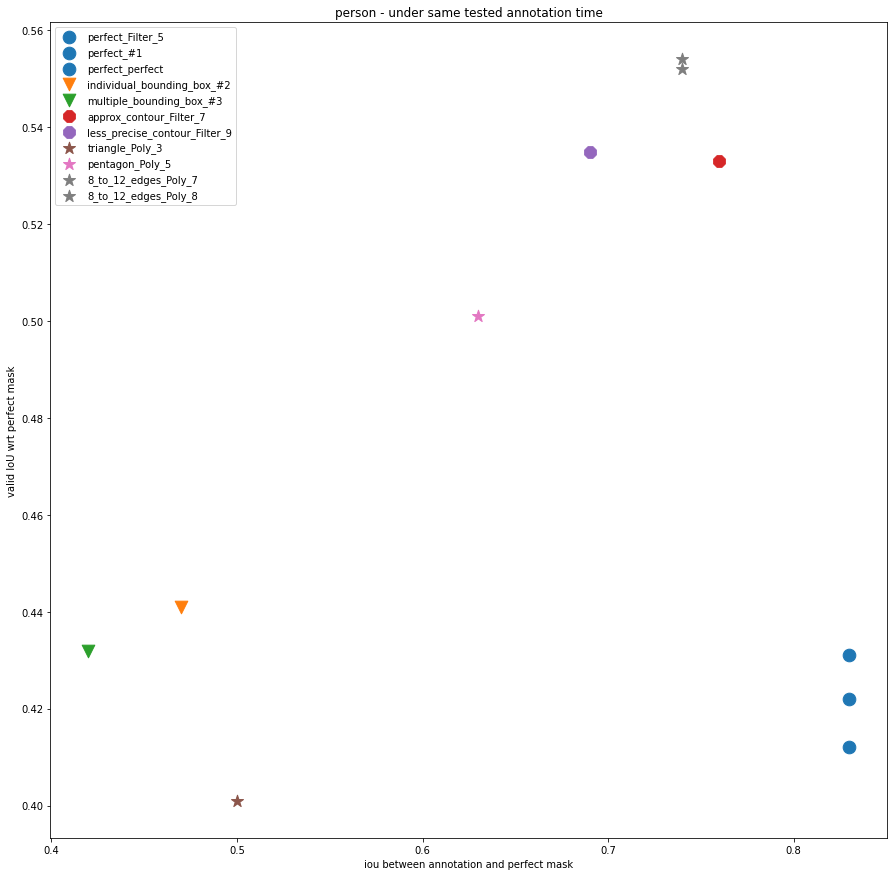

In [ ]:
c = ['#1f77b4', '#1f77b4', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#7f7f7f']
m = ['o', 'o', 'o', 'v', 'v', '8', '8', '*', '*', '*', '*']
plt.figure(figsize=(15,15))
for i in range(11):
    plt.scatter(iou[i], valid[i], color = c[i], s=160, marker = m[i], label= n[i])
plt.legend()
plt.xlabel('iou between annotation and perfect mask')
plt.ylabel('valid IoU wrt perfect mask')
plt.title('person - under same tested annotation time')

Text(0, 0.5, 'valid IoU wrt perfect mask')

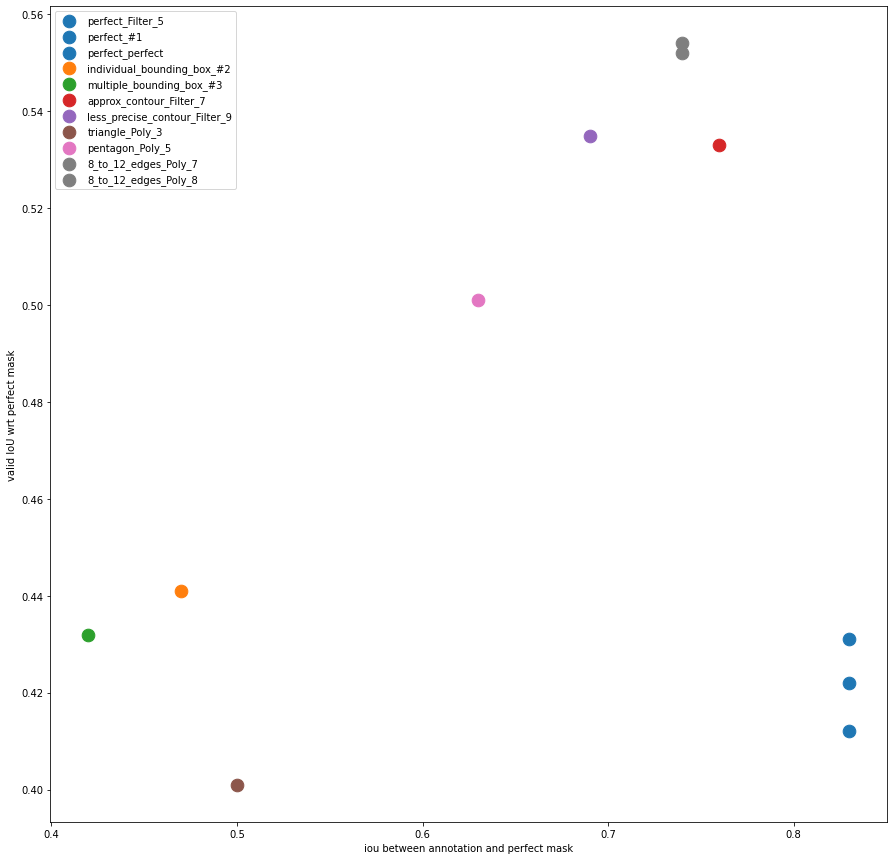

In [ ]:
c = ['#1f77b4', '#1f77b4', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#7f7f7f']
plt.figure(figsize=(15,15))
for i in range(11):
    plt.scatter(iou[i], valid[i], color = c[i], s=160, label= n[i])
plt.legend()
plt.xlabel('iou between annotation and perfect mask')
plt.ylabel('valid IoU wrt perfect mask')

In [ ]:
x=pd.read_excel('/gdrive/My Drive/real/a_10/pre.xlsx', index_col=0)
print(x)

     perfect   box   poly_3  poly_4  poly_5  poly_6  poly_7  poly_8  poly_9  \
v1     0.493  0.413   0.400   0.386   0.449   0.496   0.524   0.521   0.539   
v2     0.419  0.412   0.366   0.367   0.440   0.484   0.494   0.512    0.52   
iou    1.000  0.529   0.517   0.518   0.611   0.687   0.745   0.789   0.822   
8k     0.558  0.396   0.349   0.354   0.414   0.466   0.494   0.512   0.523   

     poly_10  filter_3  filter_5  filter_11  filter_21  
v1     0.501     0.562     0.555      0.514      0.438  
v2     0.493     0.559     0.530      0.469      0.367  
iou    0.845     0.941     0.839      0.653      0.467  
8k     0.501     0.559     0.530      0.469      0.367  


Text(0.5, 1.0, 'under same shen annotation time - previous_1 ')

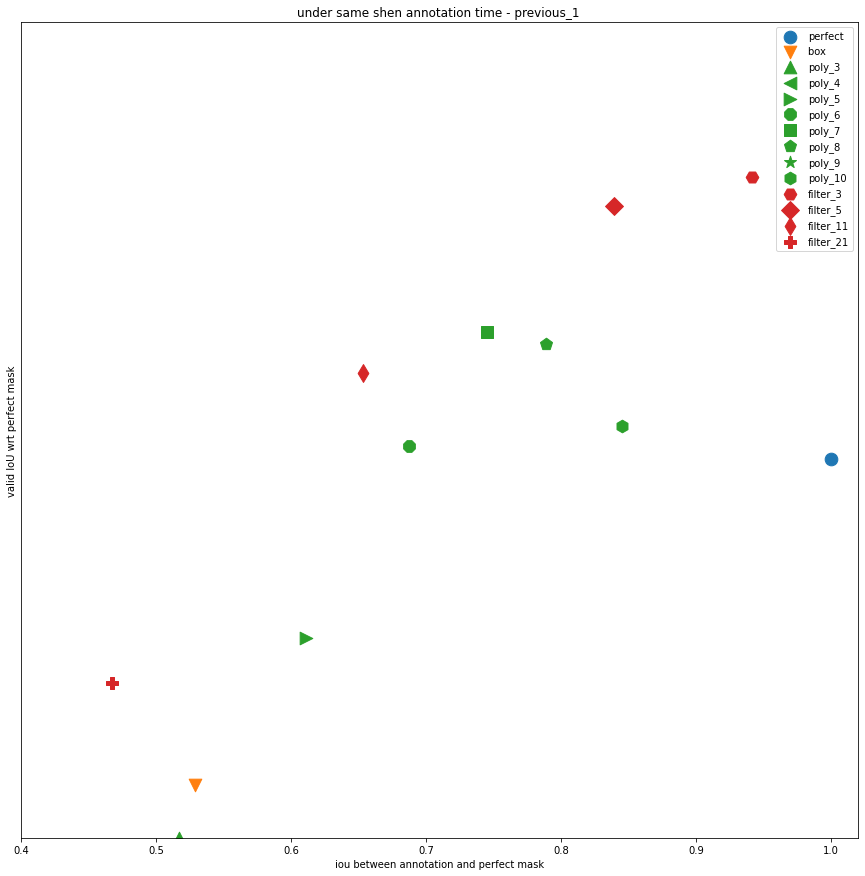

In [ ]:
v1 = x.loc['v1'].values
v2 = x.loc['v2'].values
iou = x.loc['iou'].values
ori = x.loc['8k'].values
n = x.columns.values
c = ['#1f77b4', '#ff7f0e', '#2ca02c', '#2ca02c', '#2ca02c', '#2ca02c', '#2ca02c', '#2ca02c', '#2ca02c', '#2ca02c', '#d62728', '#d62728', '#d62728', '#d62728']
m = ['o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
plt.figure(figsize=(15,15))
for i in range(14):
    plt.scatter(iou[i], v1[i], color=c[i], s=160, marker=m[i], label=n[i])
plt.legend()
plt.ylim(0.4,0.6)
plt.xlim(0.4,1.02)
plt.xlabel('iou between annotation and perfect mask')
plt.ylabel('valid IoU wrt perfect mask')
plt.title('under same shen annotation time - previous_1 ')


Text(0.5, 1.0, 'under same shen annotation time - previous_2 ')

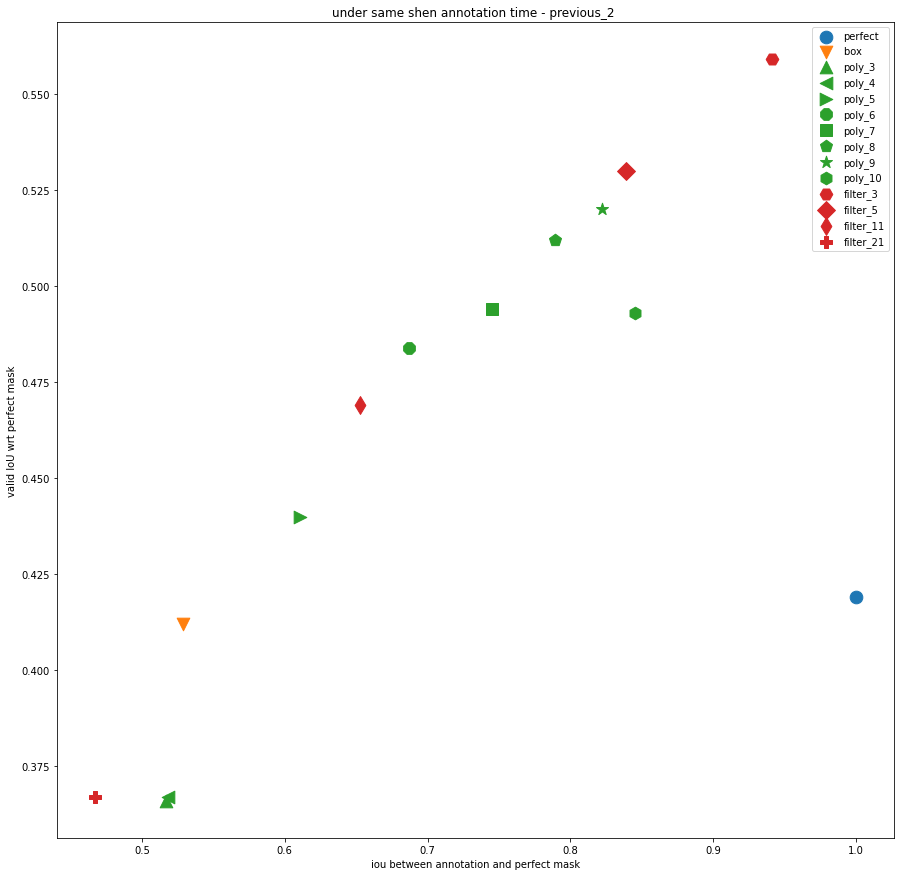

In [ ]:
plt.figure(figsize=(15,15))
for i in range(14):
    plt.scatter(iou[i], v2[i], color=c[i], s=160, marker=m[i], label=n[i])
plt.legend()
# plt.ylim(0.4,0.6)
# plt.xlim(0.4,1.02)
plt.xlabel('iou between annotation and perfect mask')
plt.ylabel('valid IoU wrt perfect mask')
plt.title('under same shen annotation time - previous_2 ')

In [ ]:
x=pd.read_excel('/gdrive/My Drive/real/a_10/road_car_validiou.xlsx', index_col=0)
print(x)

            filter_3  filter_5  filter_11  filter_21  poly_3  poly_4  poly_5  \
car_valid      0.329     0.300      0.288      0.266   0.162   0.271   0.309   
car_per        0.925     0.717      0.428      0.246   0.541   0.761   0.833   
road_valid     0.536     0.487      0.441      0.399   0.368   0.450   0.471   
road_per       0.972     0.904      0.779      0.657   0.557   0.696   0.758   

            poly_6  poly_7  poly_8  poly_9  poly_10  perfect    box  
car_valid    0.321   0.324   0.321   0.330    0.326    0.348  0.261  
car_per      0.882   0.912   0.933   0.945    0.956    1.000  0.667  
road_valid   0.470   0.505   0.511   0.521    0.519    0.557  0.396  
road_per     0.804   0.837   0.860   0.876    0.889    1.000  0.498  


Text(0.5, 1.0, 'under same train size - car')

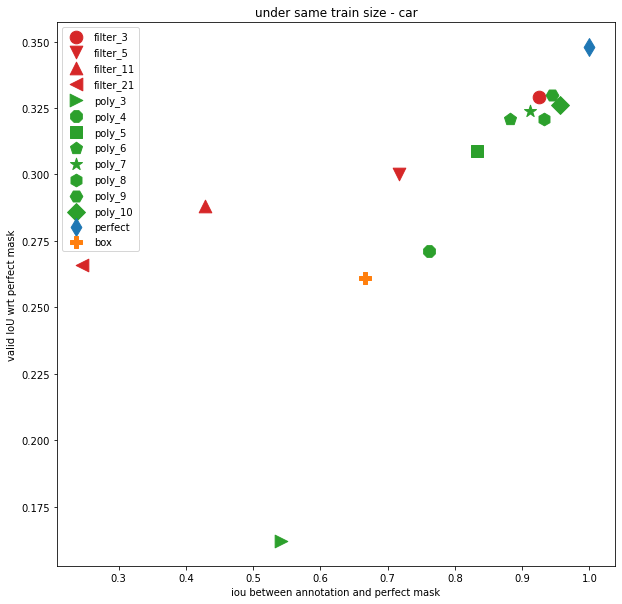

In [ ]:
n = x.columns.values
carv=x.loc['car_valid'].values
carp=x.loc['car_per'].values
roadv=x.loc['road_valid'].values
roadp=x.loc['road_per'].values
c = ['#d62728', '#d62728', '#d62728', '#d62728', '#2ca02c', '#2ca02c', '#2ca02c', '#2ca02c', '#2ca02c', '#2ca02c', '#2ca02c', '#2ca02c', '#1f77b4', '#ff7f0e']
m = ['o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
plt.figure(figsize=(10,10))
for i in range(14):
    plt.scatter(carp[i], carv[i], color=c[i], s=160, marker=m[i], label=n[i])
plt.legend()
plt.xlabel('iou between annotation and perfect mask')
plt.ylabel('valid IoU wrt perfect mask')
plt.title('under same train size - car')

Text(0.5, 1.0, 'under same train size - road')

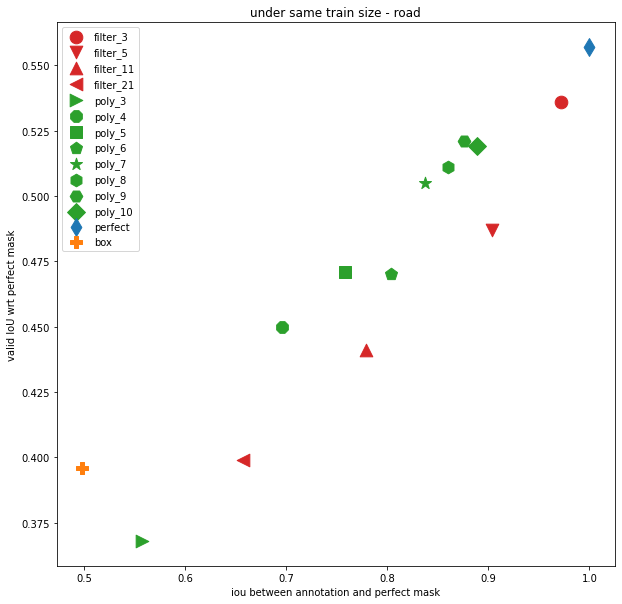

In [ ]:
plt.figure(figsize=(10,10))
for i in range(14):
    plt.scatter(roadp[i], roadv[i], color=c[i], s=160, marker=m[i], label=n[i])
plt.legend()
plt.xlabel('iou between annotation and perfect mask')
plt.ylabel('valid IoU wrt perfect mask')
plt.title('under same train size - road')

In [ ]:
y=pd.read_excel('/gdrive/My Drive/real/a_10/pre.xlsx', index_col=0)

In [ ]:
ori = y.loc['8k'].values
ny = y.columns.values
ori[-5]=0.531
iou = y.loc['iou'].values

Text(0.5, 1.0, 'under same train size - together')

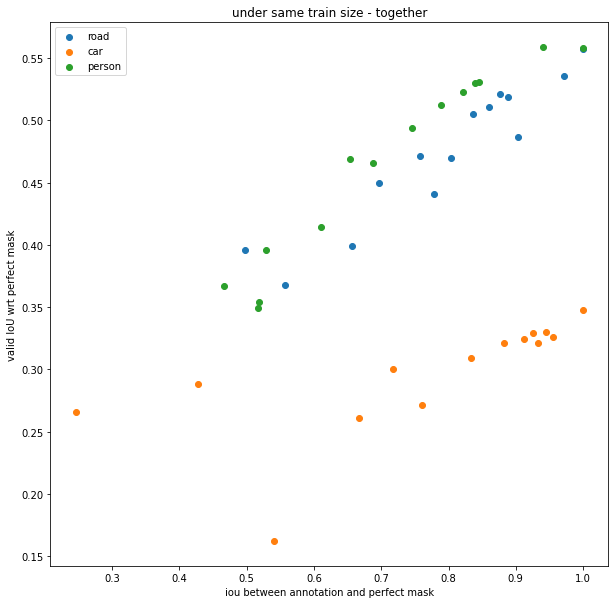

In [ ]:
plt.figure(figsize=(10,10))
plt.scatter(roadp, roadv, label='road')
plt.scatter(carp, carv, label='car')
plt.scatter(iou, ori, label='person')
plt.legend()
plt.xlabel('iou between annotation and perfect mask')
plt.ylabel('valid IoU wrt perfect mask')
plt.title('under same train size - together')

In [ ]:
print(ori)
print(n)
ori[-5]=0.531

[0.558 0.396 0.349 0.354 0.414 0.466 0.494 0.512 0.523 0.501 0.559 0.53
 0.469 0.367]
['perfect' 'box ' 'poly_3' 'poly_4' 'poly_5' 'poly_6' 'poly_7' 'poly_8'
 'poly_9' 'poly_10' 'filter_3' 'filter_5' 'filter_11' 'filter_21']


Text(0.5, 1.0, 'under same train size - previous')

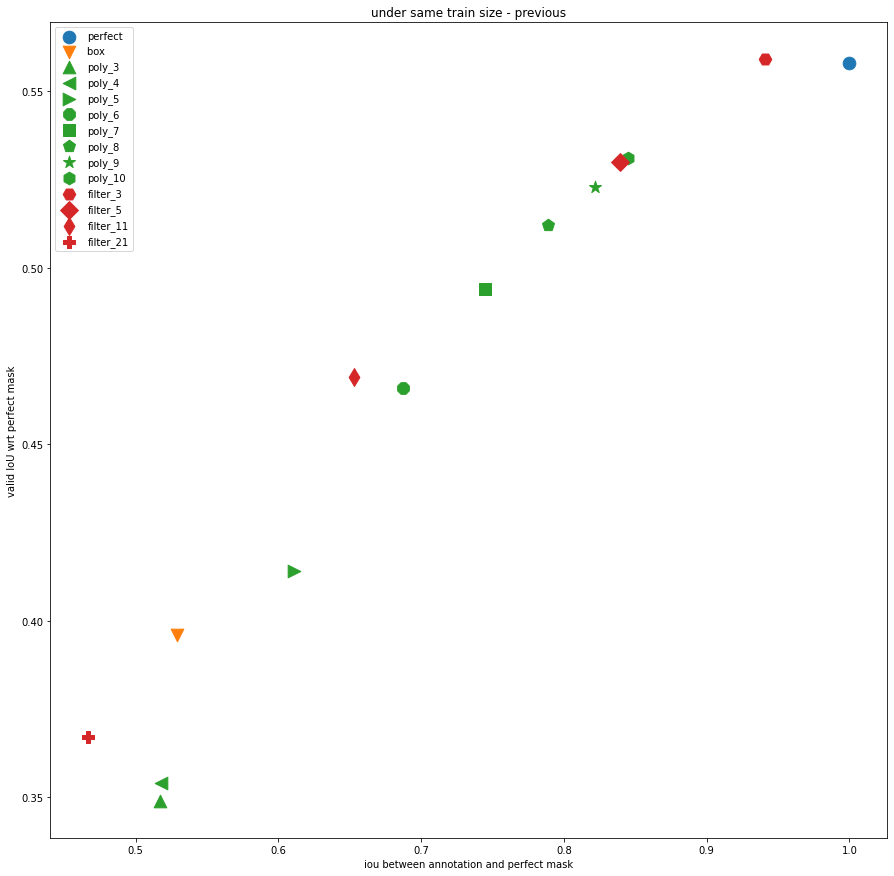

In [ ]:
plt.figure(figsize=(15,15))
for i in range(14):
    plt.scatter(iou[i], ori[i], color=c[i], s=160, marker=m[i], label=n[i])
plt.legend()
# plt.ylim(0.4,0.6)
# plt.xlim(0.4,1.02)
plt.xlabel('iou between annotation and perfect mask')
plt.ylabel('valid IoU wrt perfect mask')
plt.title('under same train size - previous')

In [ ]:
for types in y.index.values:
    for name in ['shen', 'xian', 'chris']:
        x.loc[name+'_acc', types] = y.loc[types, name]
        x.loc[name+'_eff', types] = x.loc[name+'_acc', types] / x.loc[name+'_time', types]

In [ ]:
x = pd.read_excel('/gdrive/My Drive/real/a_10/time_acc.xlsx', index_col=0, usecols=np.arange(9))

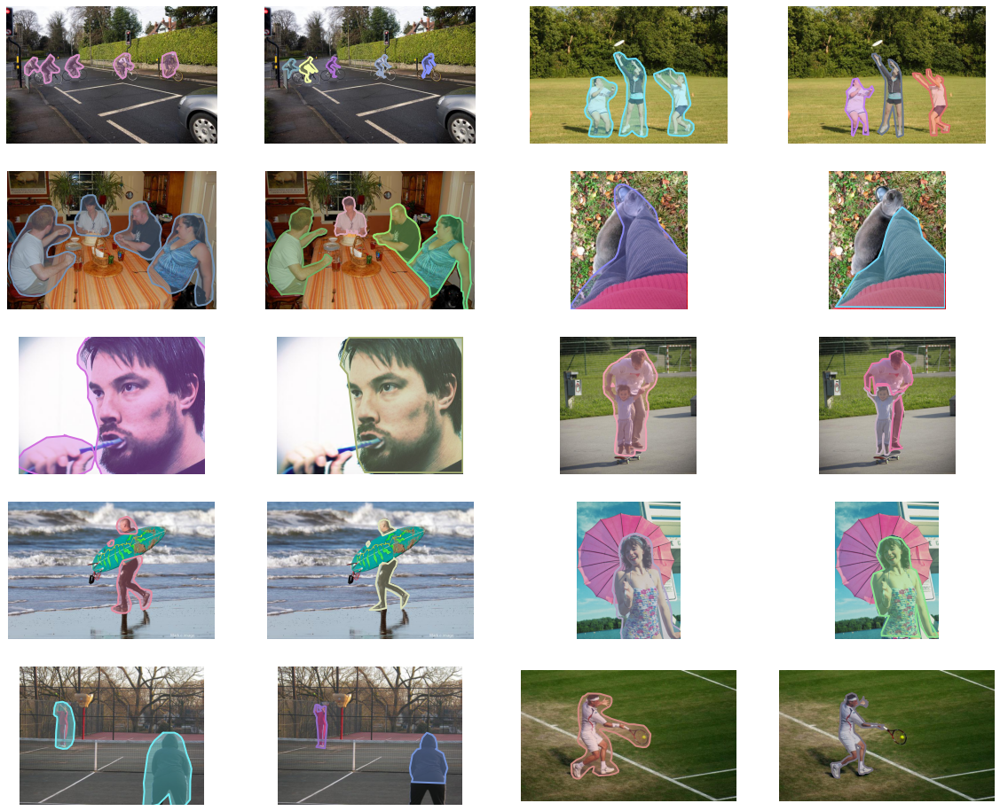

In [ ]:
show_anno_draw_p(coco, coco_train)

In [ ]:
imgs = np.load('/gdrive/My Drive/real/a_10/imgs.npy',allow_pickle=True)
print(imgs[0])

{'license': 1, 'file_name': '000000000625.jpg', 'coco_url': 'http://images.cocodataset.org/train2017/000000000625.jpg', 'height': 446, 'width': 640, 'date_captured': '2013-11-18 16:18:05', 'flickr_url': 'http://farm3.staticflickr.com/2589/3682156730_9e92670053_z.jpg', 'id': 625}


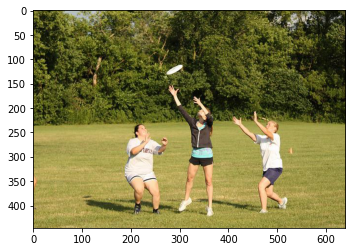

In [ ]:
I = io.imread(r'/gdrive/My Drive/real/a_10/{}'.format(imgs[0]['file_name']))
plt.imshow(I)

0

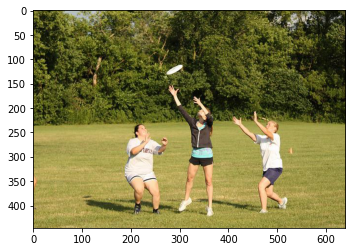

In [ ]:
plt.imshow(I)
annIds = coco_train.getAnnIds(imgIds=imgs[0]['id'], catIds=[1], iscrowd=None)
anns = coco_train.loadAnns(annIds)
coco_train.showAnns(anns)

In [ ]:
catIDs_train = coco_train.getCatIds()
cats_train = coco_train.loadCats(catIDs_train)
print(cats_train)

[{'supercategory': 'textile', 'id': 92, 'name': 'banner'}, {'supercategory': 'textile', 'id': 93, 'name': 'blanket'}, {'supercategory': 'plant', 'id': 94, 'name': 'branch'}, {'supercategory': 'building', 'id': 95, 'name': 'bridge'}, {'supercategory': 'building', 'id': 96, 'name': 'building-other'}, {'supercategory': 'plant', 'id': 97, 'name': 'bush'}, {'supercategory': 'furniture-stuff', 'id': 98, 'name': 'cabinet'}, {'supercategory': 'structural', 'id': 99, 'name': 'cage'}, {'supercategory': 'raw-material', 'id': 100, 'name': 'cardboard'}, {'supercategory': 'floor', 'id': 101, 'name': 'carpet'}, {'supercategory': 'ceiling', 'id': 102, 'name': 'ceiling-other'}, {'supercategory': 'ceiling', 'id': 103, 'name': 'ceiling-tile'}, {'supercategory': 'textile', 'id': 104, 'name': 'cloth'}, {'supercategory': 'textile', 'id': 105, 'name': 'clothes'}, {'supercategory': 'sky', 'id': 106, 'name': 'clouds'}, {'supercategory': 'furniture-stuff', 'id': 107, 'name': 'counter'}, {'supercategory': 'furni

In [ ]:
np.save('/gdrive/My Drive/real/a_10/imgs.npy',imgs)

In [ ]:
names[0] = names_old[3]
names[1] = names_old[5]

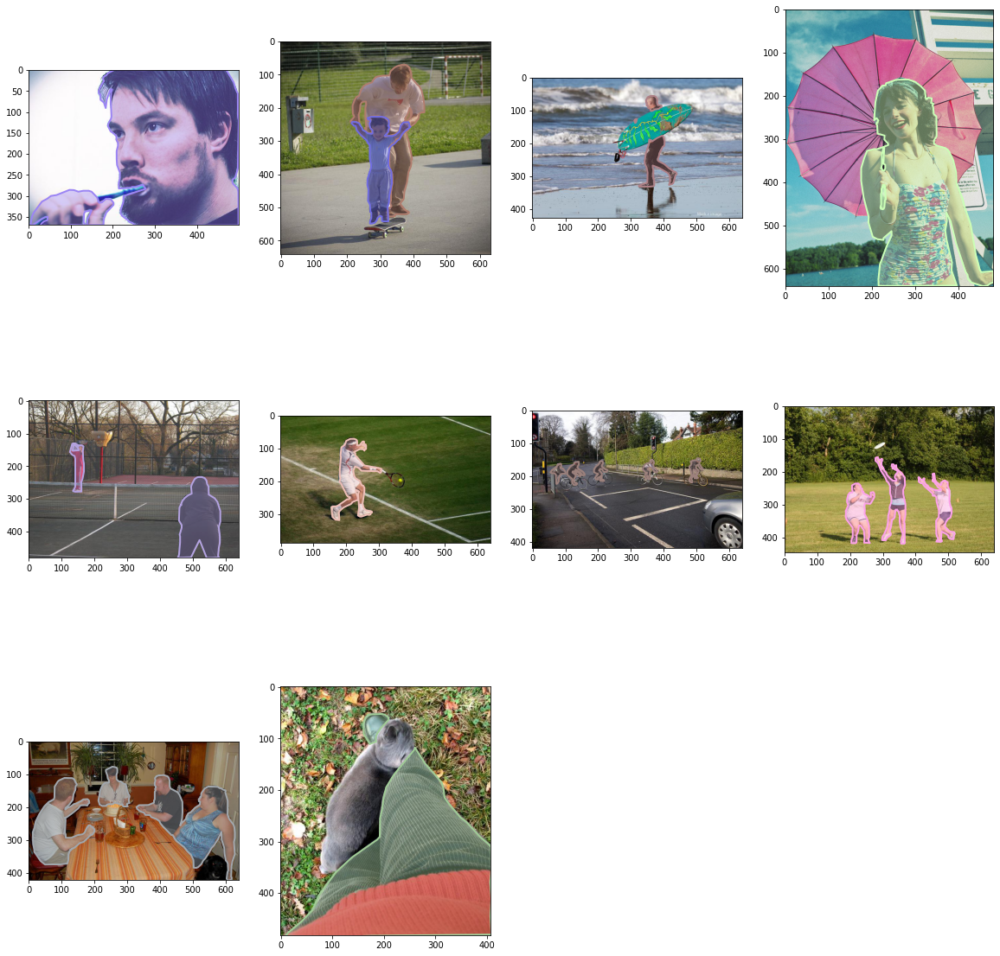

In [ ]:
plt.figure(figsize=(20,20))
ids = coco.getImgIds(catIds=[4])
for i, id in zip(ct, ids):
    plt.subplot(3,4,i)
    index = eval(coco.loadImgs([id])[0]['file_name'][-5])
    img = names[index]
    I = Image.open('{}/{}'.format(imgDir, img))
    plt.imshow(I)
    annIds = coco.getAnnIds(imgIds=id, catIds=[4], iscrowd=None)
    anns = coco.loadAnns(annIds)
    coco.showAnns(anns)


[64, 65, 66, 67, 68, 69, 60, 61, 62, 63]
4
5
6
7
8
9
1
0
2
3


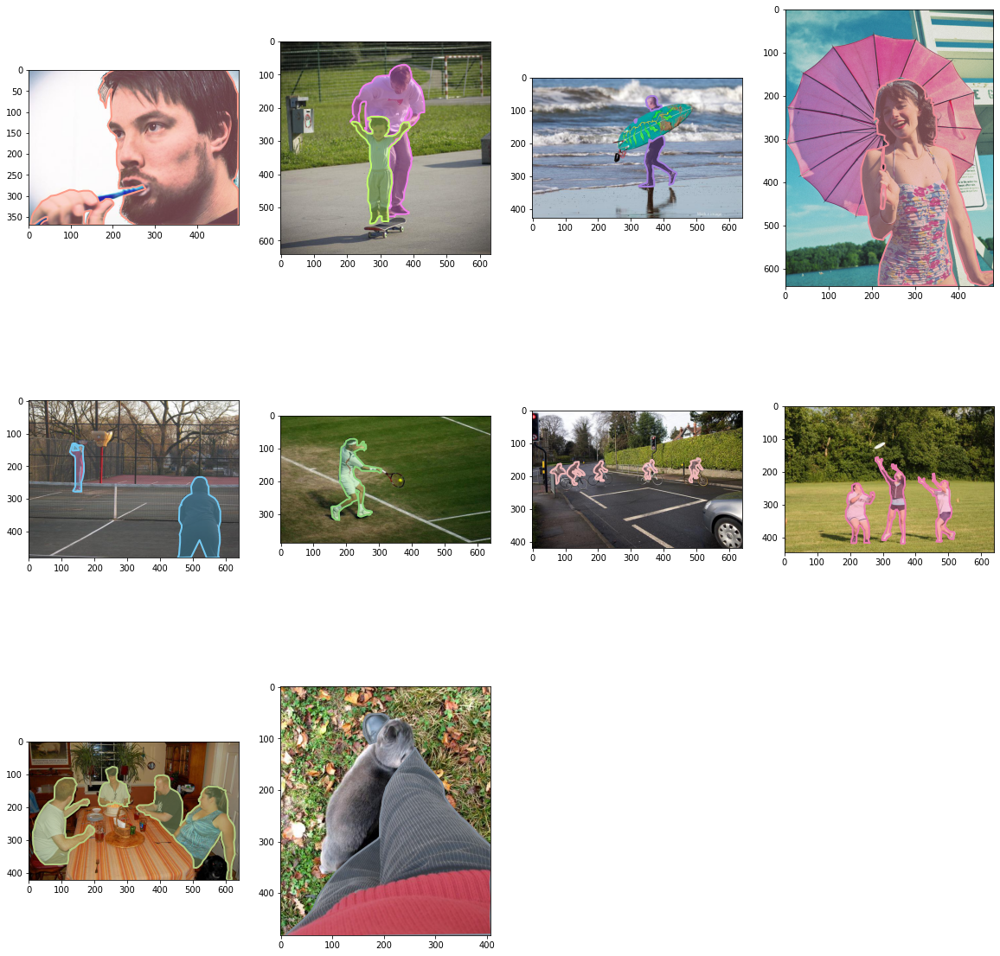

In [ ]:
plt.figure(figsize=(20,20))
ids = coco.getImgIds(catIds=[4])
print(ids)
for i, id in zip(ct, ids):
    plt.subplot(3,4,i)
    index = eval(coco.loadImgs([id])[0]['file_name'][-5])
    print(index)
    img = temp[index]
    I = Image.open('{}/{}'.format(imgDir, img))
    plt.imshow(I)
    annIds = coco.getAnnIds(imgIds=id, catIds=[4], iscrowd=None)
    anns = coco.loadAnns(annIds)
    coco.showAnns(anns)


In [ ]:


i = -1
while i > -len(nums):
    if nums[i] > nums[i - 1]:
        break
    i -= 1
# if i <= -len(nums) + 1:
#     nums = nums[::-1]
#     return None
j = -1
while j >= i:
    if nums[j] > nums[i - 1]:
        break
    j -= 1
swap(nums, i-1, j)
nums = nums[:i] + nums[i:][::-1]
        

In [ ]:
nums = [3,2,1]

In [ ]:
i = -1
while i > -len(nums):
    if nums[i] > nums[i - 1]:
        break
    i -= 1
print(i)

-3


In [ ]:
if i == -len(nums):
    nums = nums[::-1]
print(nums)

[1, 2, 3]


In [ ]:
x=[[1,3],[2,4]]
y=max(x,axis=1)

TypeError: ignored

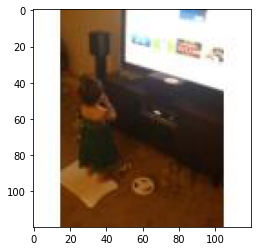

In [81]:

x = Image.open('/gdrive/My Drive/files/27_thumb.jpg')
plt.imshow(x)

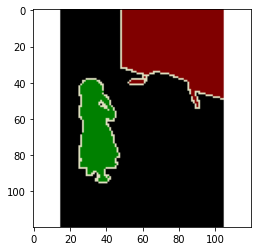

In [83]:
y = Image.open('/gdrive/My Drive/files/27_object_thumb.png')
plt.imshow(y)

In [90]:
c = np.array(y)
print(c[61,42],c[65,49])

[224 224 192] [0 0 0]


In [94]:
print(c.shape)

(120, 120, 3)


In [93]:
print(c[60:65, 35:40])

[[[  0 128   0]
  [  0 128   0]
  [  0 128   0]
  [  0 128   0]
  [  0 128   0]]

 [[  0 128   0]
  [  0 128   0]
  [  0 128   0]
  [  0 128   0]
  [  0 128   0]]

 [[  0 128   0]
  [  0 128   0]
  [  0 128   0]
  [  0 128   0]
  [  0 128   0]]

 [[  0 128   0]
  [  0 128   0]
  [  0 128   0]
  [  0 128   0]
  [  0 128   0]]

 [[  0 128   0]
  [  0 128   0]
  [  0 128   0]
  [  0 128   0]
  [  0 128   0]]]


(-0.5, 119.5, 119.5, -0.5)

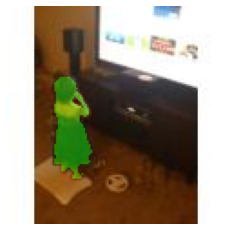

In [115]:
z = np.array(x.copy())
for i in range(120):
    for j in range(120):
        # print(c[i,j])
        if (np.array(c[i,j]) == [0, 128, 0]).all():
            z[i,j] = z[i,j] + [0, 100,0]
plt.imshow(z)
plt.axis('off')

In [109]:
q = np.array(c[i,j]) == [255, 255, 255]
print(q)

[ True  True  True]


In [110]:
print(q.all())

True
